# Top-level imports

In [1]:
%load_ext autoreload
%autoreload 2


#### import packages - setup

In [2]:
import os 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from scipy import stats
from sklearn import metrics
import datetime
import tensorflow as tf

/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/tensorflow/pyth

In [3]:
plt.style.use('fivethirtyeight')

In [4]:
data_dir = '../data/'

In [5]:
data_files = os.listdir(data_dir)
data_files.sort()
data_files

['BroughtonSeaLice_fishData.csv',
 'BroughtonSeaLice_fishInfo.csv',
 'BroughtonSeaLice_siteData.csv',
 'BroughtonSeaLice_siteInfo.csv',
 'DFOSeaLice_Data.csv',
 'DFOSeaLice_Info.csv',
 'IndustrySeaLice_Data.csv',
 'IndustrySeaLice_Info.csv',
 'README.md']

#### Wild data

In [6]:
fish_data = pd.read_csv(f'{data_dir}BroughtonSeaLice_fishData.csv', encoding='ISO-8859-1')
site_data = pd.read_csv(f'{data_dir}BroughtonSeaLice_siteData.csv', encoding='ISO-8859-1')

/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
fish_info = pd.read_csv(f'{data_dir}BroughtonSeaLice_fishInfo.csv', encoding='ISO-8859-1')
site_info = pd.read_csv(f'{data_dir}BroughtonSeaLice_siteInfo.csv', encoding='ISO-8859-1')

#### Farm data

In [8]:
dfo_data = pd.read_csv(f'{data_dir}DFOSeaLice_Data.csv')
dfo_info = pd.read_csv(f'{data_dir}DFOSeaLice_Info.csv')

In [9]:
industry_data = pd.read_csv(f'{data_dir}IndustrySeaLice_Data.csv', encoding='ISO-8859-1', low_memory=False)
industry_info = pd.read_csv(f'{data_dir}IndustrySeaLice_Info.csv', encoding='ISO-8859-1', low_memory=False)

##### Data/Feature Engineering

Possible input scenarios
- 2001-2018: We have to trust that the model can work with the large amounts of NaN values in earlier years, both in wild data and no farmed data until 2011 
- 2003-2018: 2003 is the first year we have data starting in March


## Setting overall constants

Things to set here 
- Years to analyse
- Within-season date range
- Accepted ranges
- Resampling dates

In [10]:
analysis_years = list(range(2003, 2018))

analysis_months = list(range(1, 7))

dow_dict = {
    1: 'MON',
    2: 'TUE',
    3: 'WED',
    4: 'THU', 
    5: 'FRI', 
    6: 'SAT', 
    7: 'SUN'
}

def get_dow(dt_obj):
    dow_text = dt_obj.isoweekday()
    return(dow_dict[dow_text])

wild_locations = site_data['location'].unique()

## Setting up response

### Unified adult count
This is one possible response

In [1]:
adult = fish_data[['Lep_PAmale', 'Lep_PAfemale', 
                   'Lep_male', 'Lep_gravid',
                   'Lep_nongravid', 'unid_PA',
                   'unid_adult']].sum(axis=1)

fish_data_date = pd.to_datetime(fish_data[['year', 'day', 'month']])

response = pd.DataFrame({'count':adult.values, 
                         'location':fish_data['location'].values,
                         'datetime': fish_data_date})

response_glacier = response[response['location'] == 'Glacier']



year_df_list = []
for year in analysis_years:
    subset = response_glacier[response_glacier['datetime'].dt.year == year]
    subset.loc[0] = np.nan
    subset.loc[0, 'datetime'] = datetime.datetime(year, 1, 1)
    subset.loc[1] = np.nan
    subset.loc[1, 'datetime'] = datetime.datetime(year, 12, 31)
    subset.sort_values('datetime', inplace=True)
    subset_resampled = subset.resample(f'W-{get_dow(datetime.datetime(year, 1, 1))}',
                                       on='datetime', label='left').apply(np.nanmean).interpolate(methods='linear')
    year_df_list.append(subset_resampled)
Y_glacier = pd.concat(year_df_list)

NameError: name 'fish_data' is not defined

In [19]:
#Y_glacier.to_csv('../xdata/Y_glacier.csv')

resample by week for average

This is the code I was formerly using for the resampling, it's pretty inconsistent

Y_glacier = response_glacier.resample('W', on='datetime', label='left').apply(np.nanmean)

## Setting up inputs - wild data

## Setting up inputs - wild data

In [20]:
# non-motile lice
juvenile = pd.DataFrame(fish_data[['Lep_cope', 'chalA',
                      'chalB', 'Caligus_cope',
                      'unid_cope', 'chal_unid']].sum(axis=1)).rename({0: 'count'}, axis=1)
juvenile['datetime'] = fish_data_date
juvenile['location'] = fish_data['location']

juvenile = juvenile[juvenile['location'] == 'Glacier']

year_juv_list = []
for year in analysis_years:
    subset = juvenile[juvenile['datetime'].dt.year == year]
    for loc in wild_locations:
        subset = subset.append({
            'datetime': datetime.datetime(year, 1 , 1),
            'location': loc,
            'count': np.nan
        }, ignore_index=True)
        subset = subset.append({
            'datetime': datetime.datetime(year, 12 , 31),
            'location': loc,
            'count': np.nan
        }, ignore_index=True)
    subset.sort_values('datetime', inplace=True)
    subset_resample = subset.groupby('location').resample(f'W-{get_dow(datetime.datetime(year, 1, 1))}',
                                                          on='datetime', label='left').apply(np.nanmean).interpolate(methods='linear')
    year_juv_list.append(subset_resample)
X_wild_juv = pd.concat(year_juv_list)

In [36]:
site_data = site_data[site_data['location'] == 'Glacier']

site_data['datetime'] = pd.to_datetime(site_data[['year', 'month', 'day']])

year_temp_list = []
for year in analysis_years:
    subset = site_data.loc[(site_data['datetime'].dt.year == year), ['datetime', 'temp', 'location']]
    for loc in wild_locations:
        subset = subset.append({
            'datetime': datetime.datetime(year, 1 , 1),
            'location': loc,
            'temp': np.nan
        }, ignore_index=True)
        subset = subset.append({
            'datetime': datetime.datetime(year, 12 , 31),
            'location': loc,
            'temp': np.nan
        }, ignore_index=True)
    subset.sort_values('datetime', inplace=True)
    subset.sort_values('datetime', inplace=True)
    subset_resample = subset.groupby('location').resample(f'W-{get_dow(datetime.datetime(year, 1, 1))}',
                                                          on='datetime', label='left').apply(np.nanmean).interpolate(methods='linear')
    year_temp_list.append(subset_resample)
X_wild_temp = pd.concat(year_temp_list)

In [39]:
year_sal_list = []
for year in analysis_years:
    subset = site_data.loc[(site_data['datetime'].dt.year == year), ['datetime', 'salt', 'location']]
    for loc in wild_locations:
        subset = subset.append({
            'datetime': datetime.datetime(year, 1 , 1),
            'location': loc,
            'salt': np.nan
        }, ignore_index=True)
        subset = subset.append({
            'datetime': datetime.datetime(year, 12 , 31),
            'location': loc,
            'salt': np.nan
        }, ignore_index=True)
    subset.sort_values('datetime', inplace=True)
    subset_resample = subset.groupby('location').resample(f'W-{get_dow(datetime.datetime(year, 1, 1))}',
                                                          on='datetime', label='left').apply(np.nanmean).interpolate(method='linear')
    year_sal_list.append(subset_resample)
X_wild_sal = pd.concat(year_sal_list)

## Setting up inputs - farm data

- There are of course concerns with using the industry counts as they *may* be of very low quality (I need to look much more extensively into this data)
    - Should look into what kind of predictive differences including/excluding these has 

Inputs that we want

44 - Sargeunts Pass

41 - Doctor Islet

45 - Humphrey Rock

56 - Glacier Falls

54 - Simoom Sound

50 - Burdwood Islands

53 - Sir Edmond Bay

49 - Wicklow Point 

In [40]:
industry_data[industry_data['Site Common Name'].str.contains('Sir')]['Site Common Name'].unique()
# Can't find Simoom Sound??

array(['Sir Edmund Bay'], dtype=object)

To reduce dimensionality:

Sum farm data, implementing # of fish for some sort of area infection indicator

In [41]:
relevant_farms = ['Sargeaunt Pass',
                  'Doctor Islets',
                  'Humphrey Rock',
                  'Simoom Sound*',
                  'Burdwood',
                  'Glacier Falls',
                  'Sir Edmund Bay',
                  'Wicklow Point'
                 ]
relevant_farms_iterable = ['Sargeaunt Pass',
                           'Doctor Islets',
                           'Humphrey Rock',
                           'Burdwood',
                           'Glacier Falls',
                           'Sir Edmund Bay',
                           'Wicklow Point'
                          ]


In [42]:
industry_data[industry_data['Site Common Name'].str.contains('|'.join(relevant_farms))]['Site Common Name'].unique()

array(['Burdwood', 'Sir Edmund Bay', 'Doctor Islets', 'Glacier Falls',
       'Wicklow Point', 'Sargeaunt Pass', 'Humphrey Rock',
       'Wicklow Point - post treatment', 'Wicklow Point - pre treatment',
       'Wicklow Point - post-treatment', 'Wicklow Point - pre-treatment'],
      dtype=object)

From what I can tell - most of these farms don't actually have a treatment indicator

Wondering if this is significant? 

I also can't find Simoom Sound, maybe it's here under a different name? 

In [43]:
comments_examples = industry_data[industry_data['Site Common Name'] == 'Burdwood']['Comments'].unique()

This is how I was resampling the industry data before

X_industry = relevant_farm_data[['datetime',
                            'Site Common Name',
                            'Average L. salmonis motiles per fish',
                            'Average chalimus per fish']]
X_industry = X_industry.groupby('Site Common Name').resample('W', on='datetime', label='left').mean()

The "Recent failure to control sea louse..." paper should have all the data I need until 2015

In [44]:
relevant_farm_data = industry_data[industry_data['Site Common Name'].str.contains('|'.join(relevant_farms))]

relevant_farm_data['Day'] = 1
month_map = {
    'January': 1,
    'February': 2,
    'March': 3,
    'April': 4,
    'May': 5,
    'June': 6,
    'July': 7,
    'August': 8,
    'September': 9,
    'October': 10,
    'November': 11,
    'December': 12
}
relevant_farm_data['month'] = relevant_farm_data['Month'].map(month_map)
relevant_farm_data['datetime'] = pd.to_datetime(relevant_farm_data[['Year', 'month', 'Day']])

relevant_farm_data = relevant_farm_data[relevant_farm_data['datetime'].dt.year.isin(analysis_years)]

year_industry_list = []
for year in analysis_years:
    subset = relevant_farm_data.loc[(relevant_farm_data['datetime'].dt.year == year), 
                                   ['datetime', 'Site Common Name', 'Average L. salmonis motiles per fish']]
    
    for i, farm in enumerate(relevant_farms_iterable):
        subset = subset.append({
            'datetime': datetime.datetime(year, 1 , 1),
            'Site Common Name': farm,
            'Average L. salmonis motiles per fish': np.nan
        }, ignore_index=True)
        subset = subset.append({
            'datetime': datetime.datetime(year, 12 , 31),
            'Site Common Name': farm,
            'Average L. salmonis motiles per fish': np.nan
        }, ignore_index=True)
            
    subset.sort_values('datetime', inplace=True)
    subset_resample = subset.groupby('Site Common Name').resample(f'W-{get_dow(datetime.datetime(year, 1, 1))}',
#                                                                  on='datetime', label='left').apply(np.nanmean).interpolate(methods='linear')
                                                                   on='datetime', label='left').sum().interpolate(methods='linear')

    year_industry_list.append(subset_resample)
X_industry = pd.concat(year_industry_list)


/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

In [45]:
#X_industry.to_csv('../xdata/X_industry.csv')

## Setting up inputs - weather station

In [46]:
station_dir = '../station_data/'

In [47]:
os.listdir(station_dir)

['en_climate_daily_BC_1026270_2009_P1D.csv.6',
 'en_climate_daily_BC_1026270_2010_P1D.csv.7',
 'en_climate_daily_BC_1026270_2012_P1D.csv.3',
 'en_climate_daily_BC_1026271_2019_P1D.csv.3',
 'en_climate_daily_BC_1026270_2004_P1D.csv.9',
 'en_climate_daily_BC_1026271_2016_P1D.csv.8',
 'en_climate_daily_BC_1026270_2009_P1D.csv.1',
 'en_climate_daily_BC_1026271_2019_P1D.csv.4',
 'en_climate_daily_BC_1026270_2012_P1D.csv.4',
 'en_climate_daily_BC_1026271_2014_P1D.csv.5',
 'en_climate_daily_BC_1026270_2006_P1D.csv.4',
 'en_climate_daily_BC_1026270_2011_P1D.csv.11',
 'en_climate_daily_BC_1026270_2010_P1D.csv.9',
 'en_climate_daily_BC_1026270_2009_P1D.csv.8',
 'en_climate_daily_BC_1026271_2016_P1D.csv.1',
 'en_climate_daily_BC_1026270_2006_P1D.csv.3',
 'en_climate_daily_BC_1026271_2014_P1D.csv.2',
 'en_climate_daily_BC_1026271_2016_P1D.csv.6',
 'en_climate_daily_BC_1026270_2004_P1D.csv.7',
 'en_climate_daily_BC_1026270_2012_P1D.csv',
 'en_climate_daily_BC_1026271_2016_P1D.csv.10',
 'en_climate_

In [48]:
station_files = os.listdir(station_dir)
station_files = [file for file in station_files if 'en_climate_daily_BC' in file]

stations_to_concat = []
for file in station_files:
    stations_to_concat.append(pd.read_csv(f'{station_dir}{file}'))
station_df = pd.concat(stations_to_concat)
station_df['datetime'] = pd.to_datetime(station_df['Date/Time'])

relevant_station_df = station_df[station_df['datetime'].dt.year.isin(analysis_years)]
year_station_list = []

for year in analysis_years:
    subset = relevant_station_df.loc[(relevant_station_df['datetime'].dt.year == year),
                                    ['datetime', 'Mean Temp (°C)']].rename({'Mean Temp (°C)': 'temp'})
    subset.sort_values('datetime', inplace=True)
    subset_resample = subset.resample(f'W-{get_dow(datetime.datetime(year, 1, 1))}',
                                      on='datetime', label='left').apply(np.nanmean).interpolate(methods='linear')
    year_station_list.append(subset_resample)
X_station = pd.concat(year_station_list)


In [49]:
X_station

,Mean Temp (°C)
datetime,
2002-12-25,6.300000
2003-01-01,7.385714
2003-01-08,4.385714
2003-01-15,6.057143
2003-01-22,7.600000
...,...
2017-11-26,3.514286
2017-12-03,5.471429
2017-12-10,5.500000


### Forming array for model input

In [50]:
from scipy.ndimage.interpolation import shift

In [51]:
arrays_to_stack = []

for year in analysis_years:
    juv_sub = shift(np.nanmean(X_wild_juv[(X_wild_juv.index.get_level_values(1).year == year) & 
                         X_wild_juv.index.get_level_values(1).month.isin(analysis_months)].unstack().T.values, axis=1), 3, cval=np.nan)
    temp_sub = np.nanmean(X_wild_temp[(X_wild_temp.index.get_level_values(1).year == year) & 
                          X_wild_temp.index.get_level_values(1).month.isin(analysis_months)].unstack().T.values, axis=1)
    sal_sub = np.nanmean(X_wild_sal[(X_wild_sal.index.get_level_values(1).year == year) & 
                         X_wild_sal.index.get_level_values(1).month.isin(analysis_months)].unstack().T.values, axis=1)
    ind_sub = shift(np.nanmean(X_industry[(X_industry.index.get_level_values(1).year == year) & 
                         X_industry.index.get_level_values(1).month.isin(analysis_months)].unstack().T.values, axis=1), 3, cval=np.nan)
    sta_sub = X_station[(X_station.index.year == year) & 
                         X_station.index.month.isin(analysis_months)].values
    
    year_array = np.column_stack((juv_sub, temp_sub, sal_sub, ind_sub, sta_sub))
    
    # Time lag by 2 weeks
#     year_array = np.concatenate([year_array, np.full([3, 4], np.nan)])
    arrays_to_stack.append(year_array)
    
X = np.stack(arrays_to_stack, axis=0)

In [52]:
X.shape

(15, 26, 5)

In [53]:
arrays_to_stack = []

for year in analysis_years:
    year_Y = Y_glacier[(Y_glacier.index.year == year) & 
                        Y_glacier.index.month.isin(analysis_months)].values
#     arrays_to_stack.append(np.concatenate([np.full([3, 1], np.nan), year_Y]))
    arrays_to_stack.append(year_Y)
    
Y = np.stack(arrays_to_stack, axis=0)

In [54]:
Y.shape

(15, 26, 1)

# Experimenting with models

## Import packages and set up functions

Write normalising functions here (let's go with MinMaxScaling for future implementations)

## Setup Data

### Normalise and fill NAs

Log transform?

In [130]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt

### Split into train and test

In [131]:
train_X = X_scale[:-3]
train_Y = Y_scale[:-3]

test_X = X_scale[-3:]
test_Y = Y_scale[-3:]

## Baseline

### Overall Avg

Average over all years

### Naive seasonal

In [132]:
def naive_seasonal(year: int, reference_data: pd.DataFrame):
    '''
    Naive seasonal model
    This model takes a year to be predicted in and returns the last known year's values
    
    year: Year to be predicted
    reference_data: Pandas dataframe of the test/input Y data, must have a DatetimeIndex index
    '''
    
    
    pred_subset = reference_data[reference_data.index.year == year]
    preds = pred_subset[pred_subset.index.month.isin(analysis_months)]
    
    return(np.array(preds))

## Non-parametric

Some high level notes
- This analysis is very rough and is in no way final!!!
- The normalising, feature engineering, etc. is probably the roughest part of all of this. I don't expect it to have an effect on model choice but by no means should the input/output data be taken verbatim as what I intend to use
- Optimizers: some reading has shown that RMSprop is the suggested optimiser for RNNs, this also coincides with François Chollet's use of optimisers so for now I am going with this one for RNNs and ADAM as the default for all others. This requires further research!
- Reference points: 
     - ARIMA
     - Mean & SD

### Setting up tensorboard logs

### LSTM

Notes on LSTM

- Migrate to .py
- Export model
- Vs. mean & Bayes
- Model comparison



In [45]:
!rm -rf ./logs/ 
log_dir="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [46]:
model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')

history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
                    #validation_split=0.2,)
                    #callbacks=[tensorboard_callback])

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
Epoch 1/500
12/12 [==============================] - 2s 130ms/sample - loss: 0.7089
Epoch 2/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.6650
Epoch 3/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.6375
Epoch 4/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.5939
Epoch 5/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.5653
Epoch 6/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.5302
Epoch 7/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.4878
Epoch 8/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.4435
Epoch 9/500
12/12 [==============================] - 0s 2ms

12/12 [==============================] - 0s 2ms/sample - loss: 0.2086
Epoch 86/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.2085
Epoch 87/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.2024
Epoch 88/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.2065
Epoch 89/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.2005
Epoch 90/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1999
Epoch 91/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1991
Epoch 92/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1837
Epoch 93/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1821
Epoch 94/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1852
Epoch 95/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.2055
Epoch 96/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1817
Epoch 97/500
12/1

Epoch 183/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1687
Epoch 184/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1564
Epoch 185/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1637
Epoch 186/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1678
Epoch 187/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1657
Epoch 188/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1541
Epoch 189/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1561
Epoch 190/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1594
Epoch 191/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1557
Epoch 192/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1570
Epoch 193/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1625
Epoch 194/500
12/12 [==============================] - 0s 2ms/sample - loss:

Epoch 281/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1344
Epoch 282/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1386
Epoch 283/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1413
Epoch 284/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1228
Epoch 285/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1293
Epoch 286/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1221
Epoch 287/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1218
Epoch 288/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1278
Epoch 289/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1326
Epoch 290/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1334
Epoch 291/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1405
Epoch 292/500
12/12 [==============================] - 0s 2ms/sample - loss:

Epoch 379/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1020
Epoch 380/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1078
Epoch 381/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1004
Epoch 382/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1236
Epoch 383/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1080
Epoch 384/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1107
Epoch 385/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1009
Epoch 386/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1097
Epoch 387/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0996
Epoch 388/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1024
Epoch 389/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1007
Epoch 390/500
12/12 [==============================] - 0s 2ms/sample - loss:

Epoch 477/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0882
Epoch 478/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0884
Epoch 479/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1064
Epoch 480/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1026
Epoch 481/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0902
Epoch 482/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1066
Epoch 483/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0945
Epoch 484/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0996
Epoch 485/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.1061
Epoch 486/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0996
Epoch 487/500
12/12 [==============================] - 0s 2ms/sample - loss: 0.0905
Epoch 488/500
12/12 [==============================] - 0s 2ms/sample - loss:

In [47]:
# %tensorboard --logdir logs/fit

In [48]:
train_predictions = model.predict(train_X)

# Train RMSE
metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                           train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))

0.06090043759792974

In [49]:
test_predictions = model.predict(test_X)

# Test RMSE
metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                           test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))

0.1288187728209842

In [50]:
def plot_predicted_vs_test(pred: np.ndarray, test: np.ndarray):
    fig, ax = plt.subplots(nrows=1, ncols=len(pred))
    fig.set_figwidth(14)
    
    for i in range(len(pred)):
        ax[i].plot(pred[i], color='black')
        ax[i].plot(test[i], color='gray')
        ax[i].set_title(i)
            

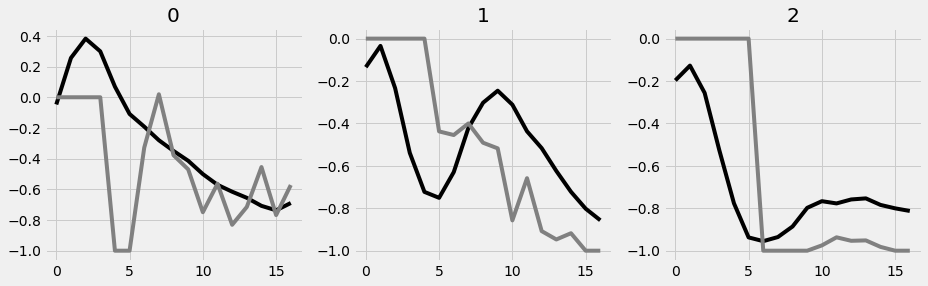

In [51]:
plot_predicted_vs_test(test_predictions, test_Y)

### Run LSTM on LOOCV sets + plot test predictions

Epoch 1/500
14/14 [==============================] - 2s 122ms/sample - loss: 0.6253
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5933
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5639
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5347
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4900
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4593
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4294
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3980
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3555
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3339
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2869
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2989
Epoch 13/50

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1876
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1620
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1797
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1742
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1899
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1870
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1772
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1702
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1762
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1679
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1884
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1461
Epoch 199/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1498
Epoch 200/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1430
Epoch 201/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1383
Epoch 202/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1505
Epoch 203/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1415
Epoch 204/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1331
Epoch 205/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1449
Epoch 206/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1409
Epoch 207/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1495
Epoch 208/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1443
Epoch 209/500
14/14 [==============================] - 0s 1ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1242
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1110
Epoch 298/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1082
Epoch 299/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1254
Epoch 300/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1250
Epoch 301/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1327
Epoch 302/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1079
Epoch 303/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1193
Epoch 304/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1150
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1201
Epoch 306/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1118
Epoch 307/500
14/14 [==============================] - 0s 1ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0920
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0977
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0924
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1054
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0996
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0953
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1093
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1035
Epoch 402/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0963
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0989
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0957
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0636
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0571
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0648
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0594
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0586
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0695
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0620
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0698
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0639
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0606
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0588
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0629
Epo

Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0493
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0539
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0602
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0547
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0596
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0498
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0553
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0488
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0477
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 296/500
14/14 [==============================] - 0s 4ms/sample - loss:

Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0400
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0424
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0811
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0734
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0710
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0663
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0722
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0715
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0807
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0702
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0721
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0758
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0743
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0651
Epoch 90/500
14/1

Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0630
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0612
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0664
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0564
Epoch 180/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0591
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0655
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0675
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0574
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0626
Epoch 185/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0521
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0580
Epoch 187/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0612
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0527
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0475
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0533
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0557
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0593
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0506
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0514
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0518
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0561
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0479
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0480
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0480
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0504
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 67/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0327
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0389
Epoch 71/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0453
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0588
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoc

Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0426
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0459
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0395
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 462/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0301
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 468/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0300
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 56/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0292
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 62/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0315
Epoch 63/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0277
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 

Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 263/500
14/14 [==============================] - 0s 1ms/sample - loss:

Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 46/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0310
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 48/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0273
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 53/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0298
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 55/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0268
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoc

Epoch 144/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0307
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 147/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 152/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0317
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 340/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0272
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 347/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0280
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 349/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0300
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 440/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0310
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 445/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0231
Epoch 446/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0298
Epoch 447/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0287
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 39/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0215
Epoch 40/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0285
Epoch 41/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0236
Epoch 42/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0210
Epoch 43/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0236
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 45/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0199
Epoch 46/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0208
Epoc

Epoch 134/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0198
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 437/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0262
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 28/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 29/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0257
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 31/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0198
Epoch 32/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 33/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0228
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoc

Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 133/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 229/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 231/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0192
Epoch 232/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0219
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 328/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 425/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 426/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0241
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 18/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 19/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoc

Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 217/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 313/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0165
Epoch 314/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 315/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 316/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 317/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 318/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 319/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 412/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 413/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 416/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 14/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 16/500
14/14 [==

Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 113/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 206/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0271
Epoch 207/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0167
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 209/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0168
Epoch 210/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0278
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0159
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0159
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
###################
Train MSE for 2012 is 0.004011152292485035
Test MSE for 2012 is 0.003094985424092501
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 5/500
14/14 [========================

Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 95/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0187
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0152
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0150
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225

Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 289/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0252
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 296/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0227
Epoch 297/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0253
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0156
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 388/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0174
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0158
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 1ms/sample - loss: 0.0189
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 87/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0159
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 89/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0165
Epoch 90/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0219
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 94/500
14/1

Epoch 180/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0195
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 182/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0273
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0148
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0154
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 278/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0180
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0153
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 287/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0243
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 289/500
14/14 [==============================] - 0s 1ms/sample - loss:

Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 380/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0201
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0147
Epoch 385/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0172
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0155
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0156
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 479/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0209
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0165
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoc

Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 172/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0169
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 179/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0175
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0143
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 269/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0158
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0155
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0145
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 371/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0170
Epoch 372/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0274
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0154
Epoch 464/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0173
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 468/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0172
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 472/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0147
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 62/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0196
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 65/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0188
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 68/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0173
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 71/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0209
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0156
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0159
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 

Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 261/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0170
Epoch 262/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0156
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 266/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0224
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 354/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0211
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0132
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0127
Epoch 359/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0197
Epoch 360/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0201
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0137
Epoch 365/500
14/14 [==============================] - 0s 1ms/sample - loss:

Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0149
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0147
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 51/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0157
Epoch 52/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0217
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0146
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0130
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 

Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0133
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0142
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0151
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0153
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 441/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0268
Epoch 442/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0161
Epoch 443/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0158
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 445/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0188
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 447/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0146
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss:

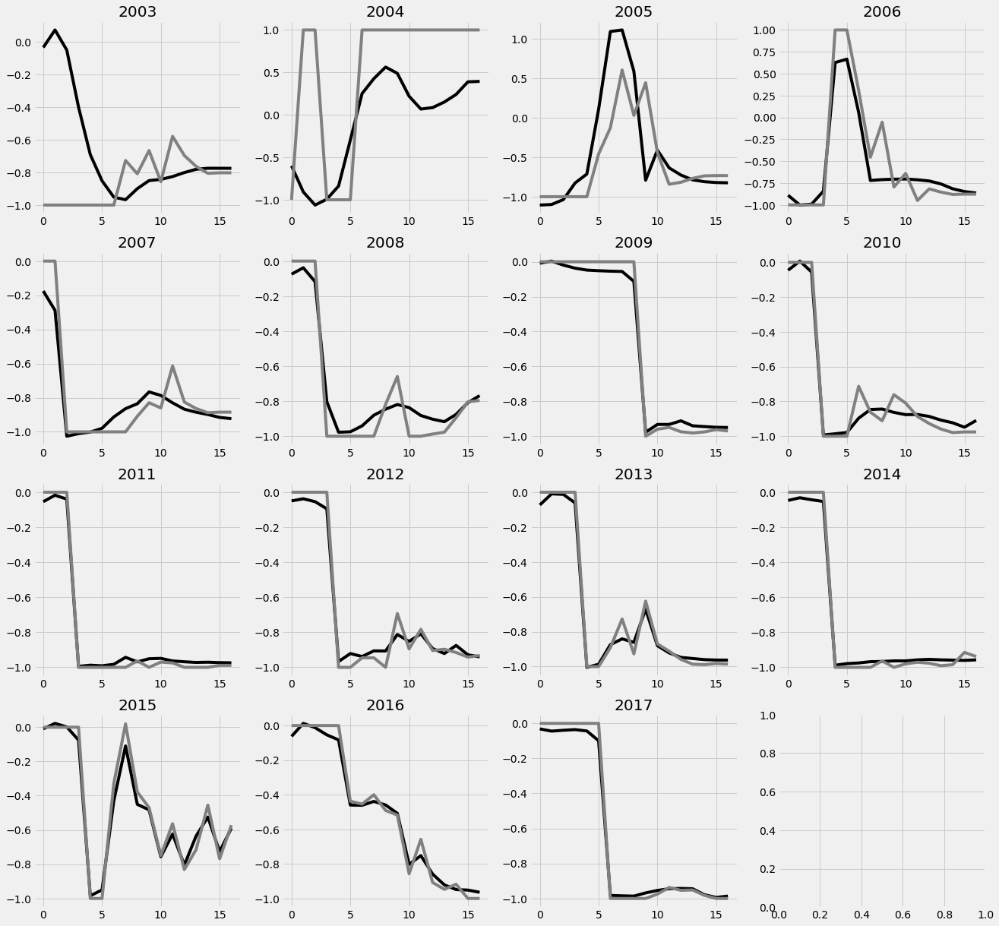

In [52]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]

    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

### Test LSTM months of test data required

In [55]:
def convert_zero_to_nan(arr: np.array) -> np.array:
    new_arr = arr
    new_arr[new_arr == 0] = np.nan
    return new_arr

##### MSE

In [56]:
def reverse_time_series(arr: np.array) -> np.array:
    """
    Works specifically on arrays where the second dimension is time
    """
    return arr[:, ::-1, :]

Instructions for updating:
Colocations handled automatically by placer.


/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
Epoch 1/1000
29/29 [==============================] - 2s 83ms/sample - loss: 0.4152
Epoch 2/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3850
Epoch 3/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3549
Epoch 4/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3230
Epoch 5/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3079
Epoch 6/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3128
Epoch 7/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3137
Epoch 8/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3112
Epoch 9/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2982
Epoch 10/1000
29/29 [====================

29/29 [==============================] - 0s 4ms/sample - loss: 0.1287
Epoch 184/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1265
Epoch 185/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1284
Epoch 186/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1286
Epoch 187/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1278
Epoch 188/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1218
Epoch 189/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1267
Epoch 190/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1246
Epoch 191/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1175
Epoch 192/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1475
Epoch 193/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1292
Epoch 194/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0934
Epoch 376/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0912
Epoch 377/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0941
Epoch 378/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0953
Epoch 379/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0880
Epoch 380/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0954
Epoch 381/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0964
Epoch 382/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0920
Epoch 383/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0976
Epoch 384/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0908
Epoch 385/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0935
Epoch 386/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0803
Epoch 568/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0816
Epoch 569/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0720
Epoch 570/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0721
Epoch 571/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0719
Epoch 572/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0807
Epoch 573/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0840
Epoch 574/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0761
Epoch 575/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0781
Epoch 576/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0739
Epoch 577/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0732
Epoch 578/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0635
Epoch 760/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0642
Epoch 761/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0642
Epoch 762/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0642
Epoch 763/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0734
Epoch 764/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0666
Epoch 765/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0677
Epoch 766/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0629
Epoch 767/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0633
Epoch 768/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0646
Epoch 769/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0707
Epoch 770/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0681
Epoch 952/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0677
Epoch 953/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0603
Epoch 954/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0607
Epoch 955/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0642
Epoch 956/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0659
Epoch 957/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0685
Epoch 958/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0705
Epoch 959/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0668
Epoch 960/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0673
Epoch 961/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0624
Epoch 962/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1174
Epoch 144/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1189
Epoch 145/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1143
Epoch 146/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1225
Epoch 147/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1190
Epoch 148/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1177
Epoch 149/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1211
Epoch 150/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1192
Epoch 151/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1192
Epoch 152/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1261
Epoch 153/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1257
Epoch 154/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0830
Epoch 336/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0776
Epoch 337/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0825
Epoch 338/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0835
Epoch 339/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0834
Epoch 340/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0784
Epoch 341/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0800
Epoch 342/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0824
Epoch 343/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0804
Epoch 344/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0744
Epoch 345/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0851
Epoch 346/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0653
Epoch 528/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0581
Epoch 529/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0641
Epoch 530/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0652
Epoch 531/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0672
Epoch 532/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0583
Epoch 533/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0591
Epoch 534/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0648
Epoch 535/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0699
Epoch 536/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0625
Epoch 537/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0612
Epoch 538/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0549
Epoch 720/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0576
Epoch 721/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0576
Epoch 722/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0546
Epoch 723/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0602
Epoch 724/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0548
Epoch 725/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0530
Epoch 726/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0586
Epoch 727/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0529
Epoch 728/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0517
Epoch 729/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0558
Epoch 730/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0458
Epoch 912/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0461
Epoch 913/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0466
Epoch 914/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0525
Epoch 915/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0462
Epoch 916/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0476
Epoch 917/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0508
Epoch 918/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0439
Epoch 919/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0481
Epoch 920/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0493
Epoch 921/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0506
Epoch 922/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1503
Epoch 104/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1604
Epoch 105/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1482
Epoch 106/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1449
Epoch 107/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1550
Epoch 108/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1520
Epoch 109/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1517
Epoch 110/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1519
Epoch 111/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1419
Epoch 112/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1425
Epoch 113/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1444
Epoch 114/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0997
Epoch 296/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1002
Epoch 297/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1039
Epoch 298/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1041
Epoch 299/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0977
Epoch 300/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0958
Epoch 301/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1070
Epoch 302/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0992
Epoch 303/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0996
Epoch 304/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0988
Epoch 305/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1005
Epoch 306/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0870
Epoch 488/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0788
Epoch 489/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0824
Epoch 490/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0776
Epoch 491/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0795
Epoch 492/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0802
Epoch 493/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0770
Epoch 494/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0785
Epoch 495/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0867
Epoch 496/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0827
Epoch 497/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0829
Epoch 498/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0698
Epoch 680/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0639
Epoch 681/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0691
Epoch 682/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0711
Epoch 683/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0703
Epoch 684/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0685
Epoch 685/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0717
Epoch 686/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0698
Epoch 687/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0665
Epoch 688/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0696
Epoch 689/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0689
Epoch 690/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0607
Epoch 872/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0595
Epoch 873/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0633
Epoch 874/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0605
Epoch 875/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0641
Epoch 876/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0573
Epoch 877/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0622
Epoch 878/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0541
Epoch 879/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0643
Epoch 880/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0587
Epoch 881/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0634
Epoch 882/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.2098
Epoch 63/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2160
Epoch 64/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2006
Epoch 65/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2018
Epoch 66/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2178
Epoch 67/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2023
Epoch 68/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1981
Epoch 69/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1953
Epoch 70/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1906
Epoch 71/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2045
Epoch 72/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1963
Epoch 73/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2013
Epoch 

Epoch 159/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1412
Epoch 160/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1351
Epoch 161/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1310
Epoch 162/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1348
Epoch 163/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1354
Epoch 164/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1326
Epoch 165/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1271
Epoch 166/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1349
Epoch 167/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1337
Epoch 168/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1309
Epoch 169/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1218
Epoch 170/1000
29/29 [==============================] - 0s 3ms/sa

29/29 [==============================] - 0s 3ms/sample - loss: 0.0896
Epoch 352/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0917
Epoch 353/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0908
Epoch 354/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0932
Epoch 355/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0962
Epoch 356/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0921
Epoch 357/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0892
Epoch 358/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0950
Epoch 359/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0941
Epoch 360/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0974
Epoch 361/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0903
Epoch 362/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0799
Epoch 544/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0747
Epoch 545/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0825
Epoch 546/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0748
Epoch 547/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0823
Epoch 548/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0825
Epoch 549/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0747
Epoch 550/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0796
Epoch 551/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0807
Epoch 552/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0724
Epoch 553/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0763
Epoch 554/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0652
Epoch 736/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0638
Epoch 737/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0699
Epoch 738/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0641
Epoch 739/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0623
Epoch 740/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0710
Epoch 741/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0660
Epoch 742/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0746
Epoch 743/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0648
Epoch 744/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0678
Epoch 745/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0695
Epoch 746/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0717
Epoch 928/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0547
Epoch 929/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0635
Epoch 930/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0619
Epoch 931/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0589
Epoch 932/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0638
Epoch 933/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0637
Epoch 934/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0593
Epoch 935/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0629
Epoch 936/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0658
Epoch 937/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0624
Epoch 938/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1557
Epoch 120/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1457
Epoch 121/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1480
Epoch 122/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1557
Epoch 123/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1399
Epoch 124/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1428
Epoch 125/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1397
Epoch 126/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1449
Epoch 127/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1448
Epoch 128/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1361
Epoch 129/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1526
Epoch 130/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1070
Epoch 312/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1007
Epoch 313/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0994
Epoch 314/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0983
Epoch 315/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0989
Epoch 316/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1015
Epoch 317/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1008
Epoch 318/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0946
Epoch 319/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0963
Epoch 320/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1017
Epoch 321/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0979
Epoch 322/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0872
Epoch 504/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0787
Epoch 505/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0791
Epoch 506/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0803
Epoch 507/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0758
Epoch 508/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0772
Epoch 509/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0761
Epoch 510/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0773
Epoch 511/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0780
Epoch 512/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0765
Epoch 513/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0777
Epoch 514/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0666
Epoch 696/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0683
Epoch 697/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0728
Epoch 698/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0712
Epoch 699/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0663
Epoch 700/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0671
Epoch 701/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0657
Epoch 702/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0671
Epoch 703/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0668
Epoch 704/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0688
Epoch 705/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0620
Epoch 706/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0614
Epoch 888/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0563
Epoch 889/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0585
Epoch 890/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0577
Epoch 891/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0649
Epoch 892/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0667
Epoch 893/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0618
Epoch 894/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0575
Epoch 895/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0650
Epoch 896/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0614
Epoch 897/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0601
Epoch 898/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1832
Epoch 80/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1792
Epoch 81/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1708
Epoch 82/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1592
Epoch 83/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1714
Epoch 84/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1552
Epoch 85/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1640
Epoch 86/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1684
Epoch 87/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1581
Epoch 88/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1628
Epoch 89/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1721
Epoch 90/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1705
Epoch 

29/29 [==============================] - 0s 3ms/sample - loss: 0.1062
Epoch 272/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1079
Epoch 273/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1034
Epoch 274/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1059
Epoch 275/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1086
Epoch 276/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1079
Epoch 277/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1118
Epoch 278/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1045
Epoch 279/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1059
Epoch 280/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1034
Epoch 281/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1077
Epoch 282/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0862
Epoch 464/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0846
Epoch 465/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0819
Epoch 466/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0845
Epoch 467/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0921
Epoch 468/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0845
Epoch 469/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0857
Epoch 470/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0811
Epoch 471/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0875
Epoch 472/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0816
Epoch 473/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0802
Epoch 474/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0723
Epoch 656/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0817
Epoch 657/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0717
Epoch 658/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0736
Epoch 659/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0665
Epoch 660/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0790
Epoch 661/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0773
Epoch 662/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0677
Epoch 663/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0692
Epoch 664/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0719
Epoch 665/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0728
Epoch 666/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0566
Epoch 848/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0606
Epoch 849/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0595
Epoch 850/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0641
Epoch 851/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0604
Epoch 852/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0652
Epoch 853/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0605
Epoch 854/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0606
Epoch 855/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0652
Epoch 856/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0558
Epoch 857/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0637
Epoch 858/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.2616
Epoch 39/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2482
Epoch 40/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2554
Epoch 41/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2446
Epoch 42/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2535
Epoch 43/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2636
Epoch 44/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2464
Epoch 45/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2268
Epoch 46/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2317
Epoch 47/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2363
Epoch 48/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2269
Epoch 49/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2240
Epoch 

29/29 [==============================] - 0s 3ms/sample - loss: 0.1273
Epoch 232/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1223
Epoch 233/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1082
Epoch 234/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1228
Epoch 235/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1179
Epoch 236/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1120
Epoch 237/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1209
Epoch 238/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1147
Epoch 239/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1164
Epoch 240/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1175
Epoch 241/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1150
Epoch 242/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0968
Epoch 424/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0945
Epoch 425/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0937
Epoch 426/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0951
Epoch 427/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0941
Epoch 428/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0939
Epoch 429/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0988
Epoch 430/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0989
Epoch 431/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0880
Epoch 432/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0894
Epoch 433/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0896
Epoch 434/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0819
Epoch 616/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0766
Epoch 617/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0781
Epoch 618/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0745
Epoch 619/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0754
Epoch 620/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0781
Epoch 621/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0808
Epoch 622/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0814
Epoch 623/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0769
Epoch 624/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0763
Epoch 625/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0795
Epoch 626/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0645
Epoch 808/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0641
Epoch 809/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0693
Epoch 810/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0711
Epoch 811/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0691
Epoch 812/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0676
Epoch 813/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0722
Epoch 814/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0692
Epoch 815/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0670
Epoch 816/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0664
Epoch 817/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0683
Epoch 818/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0599
Epoch 1000/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0560
###################
Train MSE for 2009 is 0.02811967993867527
Test MSE for 2009 is 0.26256875102738203
###################
Epoch 1/1000
29/29 [==============================] - 5s 163ms/sample - loss: 0.3999
Epoch 2/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3522
Epoch 3/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3434
Epoch 4/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3218
Epoch 5/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3103
Epoch 6/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3095
Epoch 7/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.3123
Epoch 8/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2992
Epoch 9/1000
29/29 [==============================] - 0

29/29 [==============================] - 0s 3ms/sample - loss: 0.1167
Epoch 192/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1290
Epoch 193/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1229
Epoch 194/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1267
Epoch 195/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1216
Epoch 196/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1309
Epoch 197/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1264
Epoch 198/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1222
Epoch 199/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1221
Epoch 200/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1180
Epoch 201/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1268
Epoch 202/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0966
Epoch 384/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0988
Epoch 385/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0984
Epoch 386/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0924
Epoch 387/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0960
Epoch 388/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0990
Epoch 389/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0977
Epoch 390/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0873
Epoch 391/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0958
Epoch 392/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0975
Epoch 393/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1009
Epoch 394/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0853
Epoch 576/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0875
Epoch 577/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0797
Epoch 578/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0812
Epoch 579/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0770
Epoch 580/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0782
Epoch 581/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0779
Epoch 582/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0815
Epoch 583/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0835
Epoch 584/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0796
Epoch 585/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0796
Epoch 586/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0712
Epoch 768/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0672
Epoch 769/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0660
Epoch 770/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0656
Epoch 771/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0620
Epoch 772/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0638
Epoch 773/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0652
Epoch 774/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0609
Epoch 775/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0701
Epoch 776/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0690
Epoch 777/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0652
Epoch 778/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0608
Epoch 960/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0600
Epoch 961/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0564
Epoch 962/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0573
Epoch 963/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0602
Epoch 964/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0563
Epoch 965/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0579
Epoch 966/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0541
Epoch 967/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0594
Epoch 968/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0644
Epoch 969/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0612
Epoch 970/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1487
Epoch 152/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1391
Epoch 153/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1344
Epoch 154/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1420
Epoch 155/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1432
Epoch 156/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1395
Epoch 157/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1422
Epoch 158/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1349
Epoch 159/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1354
Epoch 160/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1366
Epoch 161/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1401
Epoch 162/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1465
Epoch 344/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1337
Epoch 345/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1434
Epoch 346/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1345
Epoch 347/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1416
Epoch 348/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1325
Epoch 349/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1298
Epoch 350/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1314
Epoch 351/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1347
Epoch 352/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1313
Epoch 353/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1221
Epoch 354/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0940
Epoch 536/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1217
Epoch 537/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0874
Epoch 538/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0947
Epoch 539/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0968
Epoch 540/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0982
Epoch 541/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0945
Epoch 542/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0970
Epoch 543/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0929
Epoch 544/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0958
Epoch 545/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0946
Epoch 546/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0834
Epoch 728/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0782
Epoch 729/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0750
Epoch 730/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0795
Epoch 731/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0757
Epoch 732/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0858
Epoch 733/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0828
Epoch 734/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0770
Epoch 735/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0839
Epoch 736/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0811
Epoch 737/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0804
Epoch 738/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0693
Epoch 920/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0634
Epoch 921/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0735
Epoch 922/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0654
Epoch 923/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0705
Epoch 924/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0761
Epoch 925/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0717
Epoch 926/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0705
Epoch 927/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0722
Epoch 928/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0688
Epoch 929/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0719
Epoch 930/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1615
Epoch 112/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1441
Epoch 113/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1541
Epoch 114/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1566
Epoch 115/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1560
Epoch 116/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1637
Epoch 117/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1497
Epoch 118/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1529
Epoch 119/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1602
Epoch 120/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1529
Epoch 121/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1531
Epoch 122/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1095
Epoch 304/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1068
Epoch 305/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1033
Epoch 306/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1022
Epoch 307/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1107
Epoch 308/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1109
Epoch 309/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1033
Epoch 310/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1116
Epoch 311/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1073
Epoch 312/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1089
Epoch 313/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1041
Epoch 314/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0845
Epoch 496/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0797
Epoch 497/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0833
Epoch 498/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0793
Epoch 499/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0860
Epoch 500/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0804
Epoch 501/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0810
Epoch 502/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0822
Epoch 503/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0803
Epoch 504/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0759
Epoch 505/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0815
Epoch 506/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0769
Epoch 688/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0717
Epoch 689/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0675
Epoch 690/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0706
Epoch 691/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0719
Epoch 692/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0708
Epoch 693/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0637
Epoch 694/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0756
Epoch 695/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0700
Epoch 696/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0635
Epoch 697/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0678
Epoch 698/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0705
Epoch 880/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0688
Epoch 881/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0706
Epoch 882/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0693
Epoch 883/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0687
Epoch 884/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0728
Epoch 885/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0663
Epoch 886/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0651
Epoch 887/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0707
Epoch 888/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0717
Epoch 889/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0704
Epoch 890/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

Epoch 71/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2034
Epoch 72/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1969
Epoch 73/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2112
Epoch 74/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1995
Epoch 75/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2057
Epoch 76/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1998
Epoch 77/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1963
Epoch 78/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1924
Epoch 79/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2068
Epoch 80/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1950
Epoch 81/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1983
Epoch 82/1000
29/29 [==============================] - 0s 3ms/sample - loss:

29/29 [==============================] - 0s 3ms/sample - loss: 0.1184
Epoch 264/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1231
Epoch 265/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1217
Epoch 266/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1178
Epoch 267/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1215
Epoch 268/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1273
Epoch 269/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1202
Epoch 270/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1130
Epoch 271/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1181
Epoch 272/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1145
Epoch 273/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1173
Epoch 274/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0785
Epoch 456/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0897
Epoch 457/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0830
Epoch 458/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0851
Epoch 459/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0897
Epoch 460/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0774
Epoch 461/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0824
Epoch 462/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0901
Epoch 463/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0787
Epoch 464/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0852
Epoch 465/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0924
Epoch 466/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0759
Epoch 648/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0793
Epoch 649/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0739
Epoch 650/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0683
Epoch 651/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0728
Epoch 652/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0756
Epoch 653/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0706
Epoch 654/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0752
Epoch 655/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0679
Epoch 656/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0753
Epoch 657/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0727
Epoch 658/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0734
Epoch 840/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0632
Epoch 841/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0695
Epoch 842/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0613
Epoch 843/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0693
Epoch 844/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0695
Epoch 845/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0638
Epoch 846/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0695
Epoch 847/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0669
Epoch 848/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0655
Epoch 849/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0682
Epoch 850/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.2579
Epoch 31/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2639
Epoch 32/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2610
Epoch 33/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2661
Epoch 34/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2623
Epoch 35/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2571
Epoch 36/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2597
Epoch 37/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2631
Epoch 38/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2529
Epoch 39/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2522
Epoch 40/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2581
Epoch 41/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.2535
Epoch 

29/29 [==============================] - 0s 3ms/sample - loss: 0.1231
Epoch 224/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1095
Epoch 225/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1109
Epoch 226/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1177
Epoch 227/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1185
Epoch 228/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1169
Epoch 229/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1184
Epoch 230/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1134
Epoch 231/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1150
Epoch 232/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1171
Epoch 233/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1105
Epoch 234/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0894
Epoch 416/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0845
Epoch 417/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0864
Epoch 418/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0880
Epoch 419/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0812
Epoch 420/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0871
Epoch 421/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0878
Epoch 422/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0889
Epoch 423/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0884
Epoch 424/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0862
Epoch 425/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0813
Epoch 426/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0767
Epoch 608/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0811
Epoch 609/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0696
Epoch 610/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0746
Epoch 611/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0729
Epoch 612/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0687
Epoch 613/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0742
Epoch 614/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0700
Epoch 615/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0788
Epoch 616/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0698
Epoch 617/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0778
Epoch 618/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0673
Epoch 800/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0649
Epoch 801/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0646
Epoch 802/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0679
Epoch 803/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0618
Epoch 804/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0618
Epoch 805/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0624
Epoch 806/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0632
Epoch 807/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0609
Epoch 808/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0744
Epoch 809/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0630
Epoch 810/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0588
Epoch 992/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0636
Epoch 993/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0620
Epoch 994/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0610
Epoch 995/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0631
Epoch 996/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0615
Epoch 997/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0508
Epoch 998/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0537
Epoch 999/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0528
Epoch 1000/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0620
###################
Train MSE for 2014 is 0.024266763098870034
Test MSE for 2014 is 0.04670634425349661
###################
Epoch 1/1000
29/29 [====================

29/29 [==============================] - 0s 3ms/sample - loss: 0.1290
Epoch 184/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1327
Epoch 185/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1307
Epoch 186/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1328
Epoch 187/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1293
Epoch 188/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1268
Epoch 189/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1304
Epoch 190/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1321
Epoch 191/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1320
Epoch 192/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1287
Epoch 193/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1404
Epoch 194/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0964
Epoch 376/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0920
Epoch 377/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0887
Epoch 378/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0902
Epoch 379/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0906
Epoch 380/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0868
Epoch 381/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0883
Epoch 382/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0876
Epoch 383/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0922
Epoch 384/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0829
Epoch 385/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0879
Epoch 386/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0742
Epoch 568/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0774
Epoch 569/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0739
Epoch 570/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0742
Epoch 571/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0808
Epoch 572/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0725
Epoch 573/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0768
Epoch 574/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0730
Epoch 575/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0716
Epoch 576/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0704
Epoch 577/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0717
Epoch 578/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0636
Epoch 760/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0644
Epoch 761/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0620
Epoch 762/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0672
Epoch 763/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0608
Epoch 764/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0714
Epoch 765/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0673
Epoch 766/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0596
Epoch 767/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0662
Epoch 768/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0592
Epoch 769/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0651
Epoch 770/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0561
Epoch 952/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0592
Epoch 953/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0591
Epoch 954/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0595
Epoch 955/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0629
Epoch 956/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0646
Epoch 957/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0583
Epoch 958/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0618
Epoch 959/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0567
Epoch 960/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0567
Epoch 961/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0573
Epoch 962/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1372
Epoch 144/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1422
Epoch 145/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1424
Epoch 146/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1419
Epoch 147/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1463
Epoch 148/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1390
Epoch 149/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1433
Epoch 150/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1366
Epoch 151/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1394
Epoch 152/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1383
Epoch 153/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1396
Epoch 154/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1033
Epoch 336/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1064
Epoch 337/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1125
Epoch 338/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1065
Epoch 339/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1056
Epoch 340/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0988
Epoch 341/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1066
Epoch 342/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0986
Epoch 343/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1124
Epoch 344/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1012
Epoch 345/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1025
Epoch 346/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0891
Epoch 528/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0826
Epoch 529/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0802
Epoch 530/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0792
Epoch 531/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0771
Epoch 532/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0865
Epoch 533/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0879
Epoch 534/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0858
Epoch 535/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0834
Epoch 536/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0813
Epoch 537/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0756
Epoch 538/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0670
Epoch 720/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0699
Epoch 721/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0720
Epoch 722/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0703
Epoch 723/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0695
Epoch 724/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0717
Epoch 725/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0685
Epoch 726/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0695
Epoch 727/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0662
Epoch 728/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0691
Epoch 729/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0618
Epoch 730/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0631
Epoch 912/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0571
Epoch 913/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0579
Epoch 914/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0545
Epoch 915/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0548
Epoch 916/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0583
Epoch 917/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0706
Epoch 918/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0603
Epoch 919/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0633
Epoch 920/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0568
Epoch 921/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0558
Epoch 922/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1550
Epoch 104/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1603
Epoch 105/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1572
Epoch 106/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1625
Epoch 107/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1443
Epoch 108/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1595
Epoch 109/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1766
Epoch 110/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1553
Epoch 111/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1563
Epoch 112/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1527
Epoch 113/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1507
Epoch 114/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.1119
Epoch 296/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1034
Epoch 297/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1080
Epoch 298/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1082
Epoch 299/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1083
Epoch 300/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1033
Epoch 301/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1071
Epoch 302/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1047
Epoch 303/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1005
Epoch 304/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1057
Epoch 305/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.1029
Epoch 306/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0785
Epoch 488/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0783
Epoch 489/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0781
Epoch 490/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0786
Epoch 491/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0807
Epoch 492/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0756
Epoch 493/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0840
Epoch 494/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0762
Epoch 495/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0753
Epoch 496/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0759
Epoch 497/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0820
Epoch 498/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0612
Epoch 680/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0635
Epoch 681/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0728
Epoch 682/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0730
Epoch 683/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0731
Epoch 684/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0729
Epoch 685/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0691
Epoch 686/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0670
Epoch 687/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0677
Epoch 688/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0641
Epoch 689/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0732
Epoch 690/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 3ms/sample - loss: 0.0643
Epoch 872/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0562
Epoch 873/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0600
Epoch 874/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0621
Epoch 875/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0661
Epoch 876/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0576
Epoch 877/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0589
Epoch 878/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0627
Epoch 879/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0615
Epoch 880/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0541
Epoch 881/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.0629
Epoch 882/1000
29/29 [==============================] - 0s 3ms/sample - loss: 0.

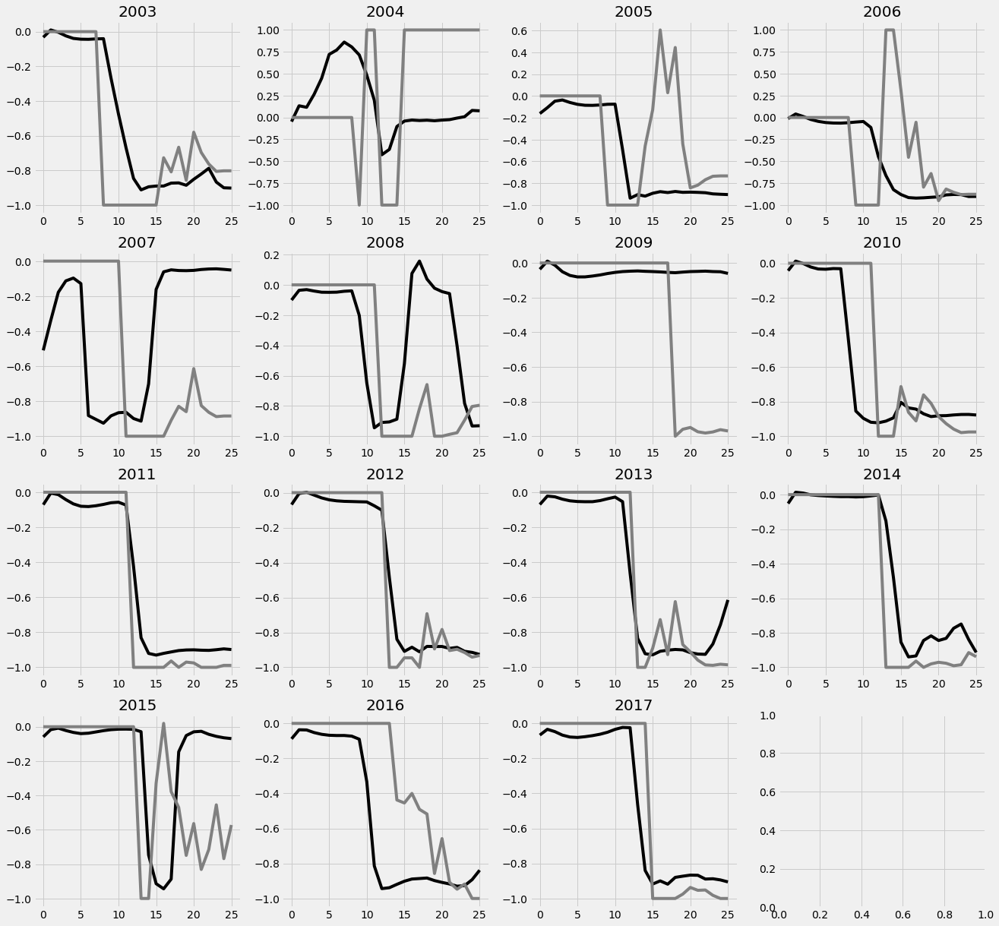

In [57]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale_nan = np.nan_to_num(X_scale)

# Augmenting training data - X
X_reverse_time = reverse_time_series(X_scale_nan)
X_reverse_magnitude = X_scale_nan * -1
X_reverse_both = reverse_time_series(X_scale_nan) * -1

# X_augmented = np.concatenate([X_scale_nan, X_reverse_time, X_reverse_magnitude, X_reverse_both])
X_augmented = np.concatenate([X_scale_nan, X_reverse_time])

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
# Y_scale = np.nan_to_num(Y_scale)
Y_scale_nan = np.nan_to_num(Y_scale)

# Augmenting training data - Y
Y_reverse_time = reverse_time_series(Y_scale_nan)
Y_reverse_magnitude = Y_scale_nan * -1
Y_reverse_both = reverse_time_series(Y_scale_nan) * -1

# Y_augmented = np.concatenate([Y_scale_nan, Y_reverse_time, Y_reverse_magnitude, Y_reverse_both])
Y_augmented = np.concatenate([Y_scale_nan, Y_reverse_time])

fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
ymax = 0
for j, year in enumerate(analysis_years):
    model = tf.keras.models.Sequential()

    model.add(tf.keras.layers.LSTM(64, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(rate=0.2))

    model.add(tf.keras.layers.Dense(64))
    model.add(tf.keras.layers.Dropout(rate=0.5))

    model.add(tf.keras.layers.LSTM(32, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(rate=0.2))

    model.add(tf.keras.layers.Dense(32))
    model.add(tf.keras.layers.Dropout(rate=0.5))
    
    model.add(tf.keras.layers.LSTM(16, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(rate=0.2))

    model.add(tf.keras.layers.Dense(16))
    model.add(tf.keras.layers.Dropout(rate=0.5))

    model.add(tf.keras.layers.Dense(1))

    model.compile(optimizer='adam', 
                  loss='mse')
    ind = np.ones((len(analysis_years) * 2,), bool)
    ind[j] = False
    train_X = np.nan_to_num(X_augmented[ind])
    train_Y = np.nan_to_num(Y_augmented[ind])

    test_X = np.nan_to_num(X_augmented[j].reshape(1, X_augmented.shape[1], X_augmented.shape[2]))
    test_Y = np.nan_to_num(Y_augmented[j].reshape(1, Y_augmented.shape[1], Y_augmented.shape[2]))
    
    history = model.fit(train_X, train_Y, 
                    epochs=1000, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    
#     plot_predictions = scalers_y[j].inverse_transform(convert_zero_to_nan(test_predictions[0]))
#     plot_true = scalers_y[j].inverse_transform(convert_zero_to_nan(test_Y[0]))
    
#     ymax = max(ymax, max(max(plot_predictions), max(plot_true)))
    
#     ax[jx].plot(plot_predictions, color='black')
#     ax[jx].plot(plot_true, color='gray')
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

# for cols in ax:
#     for row in cols:
#         row.set_ylim(0, ymax)

/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt

Epoch 1/1000
29/29 [==============================] - 9s 320ms/sample - loss: 0.4280
Epoch 2/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.4164
Epoch 3/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.4048
Epoch 4/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.3923
Epoch 5/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.3825
Epoch 6/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.3724
Epoch 7/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3568
Epoch 8/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3489
Epoch 9/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3338
Epoch 10/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.3276
Epoch 11/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3239
Epoch 12/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.3147

29/29 [==============================] - 0s 5ms/sample - loss: 0.1394
Epoch 195/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1435
Epoch 196/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1437
Epoch 197/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1500
Epoch 198/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1431
Epoch 199/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1458
Epoch 200/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1423
Epoch 201/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1476
Epoch 202/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1481
Epoch 203/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1520
Epoch 204/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1422
Epoch 205/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1117
Epoch 387/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1382
Epoch 388/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1095
Epoch 389/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1112
Epoch 390/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1151
Epoch 391/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1171
Epoch 392/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1120
Epoch 393/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1092
Epoch 394/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1196
Epoch 395/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1152
Epoch 396/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1147
Epoch 397/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0950
Epoch 579/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1037
Epoch 580/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0973
Epoch 581/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1018
Epoch 582/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1026
Epoch 583/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0995
Epoch 584/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1003
Epoch 585/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1036
Epoch 586/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0968
Epoch 587/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0998
Epoch 588/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1015
Epoch 589/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0976
Epoch 771/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0943
Epoch 772/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0896
Epoch 773/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0966
Epoch 774/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0951
Epoch 775/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0899
Epoch 776/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0850
Epoch 777/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0844
Epoch 778/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0941
Epoch 779/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0883
Epoch 780/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0933
Epoch 781/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0820
Epoch 963/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0817
Epoch 964/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0783
Epoch 965/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0835
Epoch 966/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0872
Epoch 967/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0778
Epoch 968/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0787
Epoch 969/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0837
Epoch 970/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0751
Epoch 971/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0783
Epoch 972/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0786
Epoch 973/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1359
Epoch 155/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1312
Epoch 156/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1323
Epoch 157/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1305
Epoch 158/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1340
Epoch 159/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1357
Epoch 160/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1353
Epoch 161/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1343
Epoch 162/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1363
Epoch 163/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1291
Epoch 164/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1326
Epoch 165/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1086
Epoch 347/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1119
Epoch 348/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1063
Epoch 349/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1112
Epoch 350/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1069
Epoch 351/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1063
Epoch 352/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1033
Epoch 353/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1061
Epoch 354/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1060
Epoch 355/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1120
Epoch 356/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1122
Epoch 357/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0989
Epoch 539/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0906
Epoch 540/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1011
Epoch 541/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1001
Epoch 542/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0965
Epoch 543/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1005
Epoch 544/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0915
Epoch 545/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0928
Epoch 546/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0931
Epoch 547/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1010
Epoch 548/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0898
Epoch 549/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0923
Epoch 731/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0870
Epoch 732/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0886
Epoch 733/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0885
Epoch 734/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0821
Epoch 735/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0954
Epoch 736/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0993
Epoch 737/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0928
Epoch 738/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0943
Epoch 739/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0960
Epoch 740/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0864
Epoch 741/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0830
Epoch 923/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0811
Epoch 924/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0912
Epoch 925/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0888
Epoch 926/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0944
Epoch 927/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0918
Epoch 928/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0917
Epoch 929/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0918
Epoch 930/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0825
Epoch 931/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0855
Epoch 932/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0903
Epoch 933/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1870
Epoch 115/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1667
Epoch 116/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1803
Epoch 117/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1707
Epoch 118/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1545
Epoch 119/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1633
Epoch 120/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1728
Epoch 121/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1650
Epoch 122/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1688
Epoch 123/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1694
Epoch 124/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1784
Epoch 125/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1236
Epoch 307/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1256
Epoch 308/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1177
Epoch 309/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1103
Epoch 310/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1146
Epoch 311/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1256
Epoch 312/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1207
Epoch 313/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1164
Epoch 314/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1182
Epoch 315/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1240
Epoch 316/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1195
Epoch 317/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1015
Epoch 499/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0980
Epoch 500/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0991
Epoch 501/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0964
Epoch 502/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1006
Epoch 503/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1071
Epoch 504/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1008
Epoch 505/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1116
Epoch 506/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1011
Epoch 507/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0993
Epoch 508/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0982
Epoch 509/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0973
Epoch 691/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0860
Epoch 692/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0891
Epoch 693/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0937
Epoch 694/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0821
Epoch 695/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0889
Epoch 696/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0868
Epoch 697/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0923
Epoch 698/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0955
Epoch 699/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0911
Epoch 700/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0937
Epoch 701/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0840
Epoch 883/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0813
Epoch 884/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0826
Epoch 885/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0881
Epoch 886/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0844
Epoch 887/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0774
Epoch 888/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0801
Epoch 889/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0791
Epoch 890/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0800
Epoch 891/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0862
Epoch 892/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0804
Epoch 893/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1997
Epoch 75/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1893
Epoch 76/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1913
Epoch 77/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1991
Epoch 78/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1916
Epoch 79/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1933
Epoch 80/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1822
Epoch 81/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1972
Epoch 82/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1787
Epoch 83/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2103
Epoch 84/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1879
Epoch 85/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1838
Epoch 

29/29 [==============================] - 0s 4ms/sample - loss: 0.1304
Epoch 267/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1160
Epoch 268/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1204
Epoch 269/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1198
Epoch 270/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1150
Epoch 271/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1130
Epoch 272/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1254
Epoch 273/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1236
Epoch 274/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1210
Epoch 275/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1208
Epoch 276/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1207
Epoch 277/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0915
Epoch 459/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0814
Epoch 460/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1000
Epoch 461/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0920
Epoch 462/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0959
Epoch 463/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1021
Epoch 464/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0934
Epoch 465/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0947
Epoch 466/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0896
Epoch 467/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0953
Epoch 468/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0945
Epoch 469/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0787
Epoch 651/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0831
Epoch 652/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0821
Epoch 653/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0803
Epoch 654/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0817
Epoch 655/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0848
Epoch 656/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0779
Epoch 657/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0789
Epoch 658/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0758
Epoch 659/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0792
Epoch 660/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0756
Epoch 661/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0729
Epoch 843/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0800
Epoch 844/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0739
Epoch 845/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0731
Epoch 846/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0765
Epoch 847/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0802
Epoch 848/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0755
Epoch 849/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0722
Epoch 850/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0799
Epoch 851/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0797
Epoch 852/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0754
Epoch 853/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.2851
Epoch 34/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2808
Epoch 35/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2818
Epoch 36/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2809
Epoch 37/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2779
Epoch 38/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2748
Epoch 39/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2810
Epoch 40/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2708
Epoch 41/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2769
Epoch 42/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2679
Epoch 43/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2645
Epoch 44/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2623
Epoch 

29/29 [==============================] - 0s 4ms/sample - loss: 0.1359
Epoch 227/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1438
Epoch 228/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1475
Epoch 229/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1460
Epoch 230/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1355
Epoch 231/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1374
Epoch 232/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1366
Epoch 233/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1460
Epoch 234/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1408
Epoch 235/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1458
Epoch 236/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1376
Epoch 237/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1041
Epoch 419/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0987
Epoch 420/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1061
Epoch 421/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1044
Epoch 422/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1016
Epoch 423/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1079
Epoch 424/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1103
Epoch 425/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1103
Epoch 426/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1064
Epoch 427/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1100
Epoch 428/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1073
Epoch 429/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0947
Epoch 611/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0902
Epoch 612/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0963
Epoch 613/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0900
Epoch 614/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0956
Epoch 615/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0925
Epoch 616/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0908
Epoch 617/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.0918
Epoch 618/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0923
Epoch 619/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0964
Epoch 620/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1000
Epoch 621/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0816
Epoch 803/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0886
Epoch 804/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0853
Epoch 805/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0868
Epoch 806/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0929
Epoch 807/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0921
Epoch 808/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0825
Epoch 809/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0881
Epoch 810/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0871
Epoch 811/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0852
Epoch 812/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0858
Epoch 813/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0774
Epoch 995/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0827
Epoch 996/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0814
Epoch 997/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0800
Epoch 998/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0801
Epoch 999/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0828
Epoch 1000/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0784
###################
Train MSE for 2007 is 0.04520508214798072
Test MSE for 2007 is 0.3753192609184784
###################
Epoch 1/1000
29/29 [==============================] - 12s 428ms/sample - loss: 0.4230
Epoch 2/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.4090
Epoch 3/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3929
Epoch 4/1000
29/29 [=========================

29/29 [==============================] - 0s 4ms/sample - loss: 0.1471
Epoch 187/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1501
Epoch 188/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1448
Epoch 189/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1470
Epoch 190/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1517
Epoch 191/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1470
Epoch 192/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1536
Epoch 193/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1474
Epoch 194/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1549
Epoch 195/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1515
Epoch 196/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1499
Epoch 197/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1240
Epoch 379/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1312
Epoch 380/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1264
Epoch 381/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1275
Epoch 382/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1260
Epoch 383/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1263
Epoch 384/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1221
Epoch 385/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1253
Epoch 386/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1286
Epoch 387/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1232
Epoch 388/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1248
Epoch 389/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1062
Epoch 571/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1099
Epoch 572/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1048
Epoch 573/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1004
Epoch 574/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1063
Epoch 575/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0969
Epoch 576/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1104
Epoch 577/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1066
Epoch 578/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1086
Epoch 579/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1130
Epoch 580/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1100
Epoch 581/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0966
Epoch 763/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0977
Epoch 764/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0983
Epoch 765/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0925
Epoch 766/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0935
Epoch 767/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0952
Epoch 768/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0945
Epoch 769/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0998
Epoch 770/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0951
Epoch 771/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0973
Epoch 772/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0991
Epoch 773/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0908
Epoch 955/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0900
Epoch 956/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0941
Epoch 957/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0872
Epoch 958/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0916
Epoch 959/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0847
Epoch 960/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0898
Epoch 961/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0913
Epoch 962/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0846
Epoch 963/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0834
Epoch 964/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0882
Epoch 965/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1587
Epoch 147/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1661
Epoch 148/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1667
Epoch 149/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1569
Epoch 150/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1524
Epoch 151/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1593
Epoch 152/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1584
Epoch 153/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1560
Epoch 154/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1596
Epoch 155/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1637
Epoch 156/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1573
Epoch 157/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1227
Epoch 339/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1196
Epoch 340/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1192
Epoch 341/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1191
Epoch 342/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1169
Epoch 343/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1209
Epoch 344/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1188
Epoch 345/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1198
Epoch 346/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1195
Epoch 347/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1282
Epoch 348/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1162
Epoch 349/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1099
Epoch 531/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1122
Epoch 532/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1096
Epoch 533/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1121
Epoch 534/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1073
Epoch 535/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1162
Epoch 536/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1087
Epoch 537/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1088
Epoch 538/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1051
Epoch 539/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1138
Epoch 540/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1037
Epoch 541/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1030
Epoch 723/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0967
Epoch 724/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1035
Epoch 725/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1029
Epoch 726/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0947
Epoch 727/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1017
Epoch 728/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0989
Epoch 729/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1023
Epoch 730/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1027
Epoch 731/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0942
Epoch 732/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1023
Epoch 733/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0905
Epoch 915/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0900
Epoch 916/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0874
Epoch 917/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0909
Epoch 918/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0987
Epoch 919/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0934
Epoch 920/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0945
Epoch 921/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0961
Epoch 922/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0937
Epoch 923/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0903
Epoch 924/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0960
Epoch 925/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1953
Epoch 107/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1779
Epoch 108/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1897
Epoch 109/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1972
Epoch 110/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1934
Epoch 111/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1856
Epoch 112/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1719
Epoch 113/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1841
Epoch 114/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1847
Epoch 115/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1760
Epoch 116/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1713
Epoch 117/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1363
Epoch 299/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1263
Epoch 300/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1328
Epoch 301/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1358
Epoch 302/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1298
Epoch 303/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1313
Epoch 304/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1345
Epoch 305/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1318
Epoch 306/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1312
Epoch 307/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1311
Epoch 308/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1213
Epoch 309/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1184
Epoch 491/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1072
Epoch 492/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1114
Epoch 493/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1144
Epoch 494/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1108
Epoch 495/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1101
Epoch 496/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1121
Epoch 497/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1145
Epoch 498/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1099
Epoch 499/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1082
Epoch 500/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1194
Epoch 501/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1037
Epoch 683/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1050
Epoch 684/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0995
Epoch 685/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1013
Epoch 686/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0987
Epoch 687/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0957
Epoch 688/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0957
Epoch 689/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0975
Epoch 690/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1054
Epoch 691/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0963
Epoch 692/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0962
Epoch 693/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0885
Epoch 875/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0956
Epoch 876/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0898
Epoch 877/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0985
Epoch 878/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0941
Epoch 879/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0871
Epoch 880/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0892
Epoch 881/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0936
Epoch 882/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0958
Epoch 883/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0978
Epoch 884/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0951
Epoch 885/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

Epoch 66/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2566
Epoch 67/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2550
Epoch 68/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2495
Epoch 69/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2564
Epoch 70/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2481
Epoch 71/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2431
Epoch 72/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2454
Epoch 73/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.2385
Epoch 74/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2587
Epoch 75/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2374
Epoch 76/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2396
Epoch 77/1000
29/29 [==============================] - 0s 4ms/sample - loss:

29/29 [==============================] - 0s 4ms/sample - loss: 0.1482
Epoch 259/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1548
Epoch 260/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1556
Epoch 261/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1485
Epoch 262/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1557
Epoch 263/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1518
Epoch 264/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1439
Epoch 265/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1521
Epoch 266/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1451
Epoch 267/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1546
Epoch 268/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1438
Epoch 269/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1340
Epoch 451/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1292
Epoch 452/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1336
Epoch 453/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1339
Epoch 454/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1226
Epoch 455/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1248
Epoch 456/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1255
Epoch 457/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1249
Epoch 458/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1219
Epoch 459/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1225
Epoch 460/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1329
Epoch 461/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 6ms/sample - loss: 0.1037
Epoch 643/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1063
Epoch 644/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1091
Epoch 645/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1077
Epoch 646/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1108
Epoch 647/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1129
Epoch 648/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1065
Epoch 649/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1063
Epoch 650/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0986
Epoch 651/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1071
Epoch 652/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1015
Epoch 653/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1008
Epoch 835/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0972
Epoch 836/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0920
Epoch 837/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0923
Epoch 838/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0966
Epoch 839/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0943
Epoch 840/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0908
Epoch 841/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0955
Epoch 842/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0898
Epoch 843/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0925
Epoch 844/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0942
Epoch 845/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.2985
Epoch 26/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3007
Epoch 27/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2881
Epoch 28/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2985
Epoch 29/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2959
Epoch 30/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3011
Epoch 31/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2966
Epoch 32/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2870
Epoch 33/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2974
Epoch 34/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2888
Epoch 35/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2809
Epoch 36/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2858
Epoch 

29/29 [==============================] - 0s 5ms/sample - loss: 0.1546
Epoch 219/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1438
Epoch 220/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1477
Epoch 221/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1476
Epoch 222/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1522
Epoch 223/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1537
Epoch 224/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1475
Epoch 225/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1427
Epoch 226/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1576
Epoch 227/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1509
Epoch 228/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1369
Epoch 229/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1128
Epoch 411/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1143
Epoch 412/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1180
Epoch 413/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1119
Epoch 414/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1157
Epoch 415/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1118
Epoch 416/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1154
Epoch 417/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1169
Epoch 418/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1123
Epoch 419/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1169
Epoch 420/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1111
Epoch 421/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0990
Epoch 603/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1028
Epoch 604/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1040
Epoch 605/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1034
Epoch 606/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0942
Epoch 607/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1026
Epoch 608/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1010
Epoch 609/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1058
Epoch 610/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0965
Epoch 611/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1031
Epoch 612/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0986
Epoch 613/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0971
Epoch 795/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.0873
Epoch 796/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1022
Epoch 797/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0900
Epoch 798/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0991
Epoch 799/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0914
Epoch 800/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0881
Epoch 801/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0934
Epoch 802/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0961
Epoch 803/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0949
Epoch 804/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0885
Epoch 805/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0887
Epoch 987/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0875
Epoch 988/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0895
Epoch 989/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0897
Epoch 990/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0816
Epoch 991/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0830
Epoch 992/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0864
Epoch 993/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0790
Epoch 994/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.0872
Epoch 995/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0860
Epoch 996/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0881
Epoch 997/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.2021
Epoch 83/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2004
Epoch 84/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1890
Epoch 85/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1926
Epoch 86/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1899
Epoch 87/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2070
Epoch 88/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2017
Epoch 89/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1826
Epoch 90/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1902
Epoch 91/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1819
Epoch 92/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1921
Epoch 93/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1843
Epoch 

29/29 [==============================] - 0s 5ms/sample - loss: 0.1292
Epoch 275/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1431
Epoch 276/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1378
Epoch 277/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1294
Epoch 278/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1376
Epoch 279/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1348
Epoch 280/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1298
Epoch 281/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1358
Epoch 282/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1459
Epoch 283/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1321
Epoch 284/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1321
Epoch 285/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1075
Epoch 467/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1146
Epoch 468/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1120
Epoch 469/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1142
Epoch 470/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1051
Epoch 471/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1130
Epoch 472/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1058
Epoch 473/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1099
Epoch 474/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1075
Epoch 475/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1204
Epoch 476/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1058
Epoch 477/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1016
Epoch 659/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1034
Epoch 660/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1020
Epoch 661/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0918
Epoch 662/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0945
Epoch 663/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0983
Epoch 664/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0966
Epoch 665/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0994
Epoch 666/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0900
Epoch 667/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0945
Epoch 668/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0922
Epoch 669/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0934
Epoch 851/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0928
Epoch 852/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.0880
Epoch 853/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0937
Epoch 854/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0860
Epoch 855/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0892
Epoch 856/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0907
Epoch 857/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0907
Epoch 858/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0873
Epoch 859/1000
29/29 [==============================] - 0s 8ms/sample - loss: 0.0853
Epoch 860/1000
29/29 [==============================] - 0s 7ms/sample - loss: 0.0879
Epoch 861/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.

29/29 [==============================] - 0s 6ms/sample - loss: 0.3051
Epoch 42/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2648
Epoch 43/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.2774
Epoch 44/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2769
Epoch 45/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2773
Epoch 46/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2786
Epoch 47/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2763
Epoch 48/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2716
Epoch 49/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2710
Epoch 50/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.2771
Epoch 51/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2662
Epoch 52/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.2706
Epoch 

29/29 [==============================] - 0s 5ms/sample - loss: 0.1514
Epoch 235/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1475
Epoch 236/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1396
Epoch 237/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1489
Epoch 238/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1450
Epoch 239/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1451
Epoch 240/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1487
Epoch 241/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1428
Epoch 242/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1555
Epoch 243/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1465
Epoch 244/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1468
Epoch 245/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1152
Epoch 427/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1251
Epoch 428/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1172
Epoch 429/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1152
Epoch 430/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1178
Epoch 431/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1195
Epoch 432/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1135
Epoch 433/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1114
Epoch 434/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1141
Epoch 435/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1089
Epoch 436/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1137
Epoch 437/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1140
Epoch 619/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0978
Epoch 620/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1036
Epoch 621/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0982
Epoch 622/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0990
Epoch 623/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1005
Epoch 624/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1032
Epoch 625/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1022
Epoch 626/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1037
Epoch 627/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0967
Epoch 628/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0991
Epoch 629/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0977
Epoch 811/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0965
Epoch 812/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0921
Epoch 813/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0981
Epoch 814/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0929
Epoch 815/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0967
Epoch 816/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0933
Epoch 817/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0944
Epoch 818/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0971
Epoch 819/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0939
Epoch 820/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0933
Epoch 821/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 17s 602ms/sample - loss: 0.4318
Epoch 2/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.4178
Epoch 3/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.4042
Epoch 4/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3860
Epoch 5/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3639
Epoch 6/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3515
Epoch 7/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3280
Epoch 8/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3482
Epoch 9/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3197
Epoch 10/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3294
Epoch 11/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.3208
Epoch 12/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.3133
Epoch 13/10

29/29 [==============================] - 0s 4ms/sample - loss: 0.1429
Epoch 195/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1471
Epoch 196/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1340
Epoch 197/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1460
Epoch 198/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1333
Epoch 199/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1322
Epoch 200/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1463
Epoch 201/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1315
Epoch 202/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1412
Epoch 203/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1483
Epoch 204/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1374
Epoch 205/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1094
Epoch 387/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1062
Epoch 388/1000
29/29 [==============================] - 0s 6ms/sample - loss: 0.1101
Epoch 389/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1036
Epoch 390/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1069
Epoch 391/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1060
Epoch 392/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1039
Epoch 393/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1017
Epoch 394/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1070
Epoch 395/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1015
Epoch 396/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1113
Epoch 397/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.0995
Epoch 579/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0874
Epoch 580/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0968
Epoch 581/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0976
Epoch 582/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0915
Epoch 583/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0978
Epoch 584/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0955
Epoch 585/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0986
Epoch 586/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0856
Epoch 587/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0948
Epoch 588/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0978
Epoch 589/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0918
Epoch 771/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0905
Epoch 772/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0954
Epoch 773/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0902
Epoch 774/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0811
Epoch 775/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0906
Epoch 776/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0891
Epoch 777/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0897
Epoch 778/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0894
Epoch 779/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0878
Epoch 780/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0873
Epoch 781/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0770
Epoch 963/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0868
Epoch 964/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0767
Epoch 965/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0875
Epoch 966/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0842
Epoch 967/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0795
Epoch 968/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0863
Epoch 969/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0843
Epoch 970/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0817
Epoch 971/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0804
Epoch 972/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0873
Epoch 973/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1641
Epoch 155/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1613
Epoch 156/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1588
Epoch 157/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1564
Epoch 158/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1591
Epoch 159/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1639
Epoch 160/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1523
Epoch 161/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1710
Epoch 162/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1547
Epoch 163/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1566
Epoch 164/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1548
Epoch 165/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1179
Epoch 347/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1171
Epoch 348/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1268
Epoch 349/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1133
Epoch 350/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1305
Epoch 351/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1251
Epoch 352/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1316
Epoch 353/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1331
Epoch 354/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1233
Epoch 355/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1199
Epoch 356/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1174
Epoch 357/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1057
Epoch 539/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1020
Epoch 540/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1083
Epoch 541/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0978
Epoch 542/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1089
Epoch 543/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1048
Epoch 544/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1037
Epoch 545/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1054
Epoch 546/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1078
Epoch 547/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1038
Epoch 548/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1107
Epoch 549/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0890
Epoch 731/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0949
Epoch 732/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0947
Epoch 733/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0972
Epoch 734/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0947
Epoch 735/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0925
Epoch 736/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0903
Epoch 737/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0900
Epoch 738/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0896
Epoch 739/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0998
Epoch 740/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0881
Epoch 741/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0855
Epoch 923/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0814
Epoch 924/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0892
Epoch 925/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0933
Epoch 926/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0901
Epoch 927/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0864
Epoch 928/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0771
Epoch 929/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0860
Epoch 930/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0806
Epoch 931/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0812
Epoch 932/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0939
Epoch 933/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1872
Epoch 115/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1744
Epoch 116/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1802
Epoch 117/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1834
Epoch 118/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1809
Epoch 119/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1747
Epoch 120/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1775
Epoch 121/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1721
Epoch 122/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1862
Epoch 123/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1698
Epoch 124/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1828
Epoch 125/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1407
Epoch 307/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1285
Epoch 308/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1297
Epoch 309/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1331
Epoch 310/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1388
Epoch 311/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1346
Epoch 312/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1327
Epoch 313/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1248
Epoch 314/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1367
Epoch 315/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1337
Epoch 316/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1442
Epoch 317/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 5ms/sample - loss: 0.1112
Epoch 499/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1097
Epoch 500/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1094
Epoch 501/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1079
Epoch 502/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1046
Epoch 503/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1053
Epoch 504/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1060
Epoch 505/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1111
Epoch 506/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1006
Epoch 507/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1078
Epoch 508/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1054
Epoch 509/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.1034
Epoch 691/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1020
Epoch 692/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1043
Epoch 693/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1028
Epoch 694/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.1007
Epoch 695/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1004
Epoch 696/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.0995
Epoch 697/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.1046
Epoch 698/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0959
Epoch 699/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0998
Epoch 700/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0971
Epoch 701/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.

29/29 [==============================] - 0s 4ms/sample - loss: 0.0858
Epoch 883/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0889
Epoch 884/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0978
Epoch 885/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0922
Epoch 886/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0912
Epoch 887/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0899
Epoch 888/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0916
Epoch 889/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0938
Epoch 890/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0902
Epoch 891/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0886
Epoch 892/1000
29/29 [==============================] - 0s 4ms/sample - loss: 0.0908
Epoch 893/1000
29/29 [==============================] - 0s 5ms/sample - loss: 0.

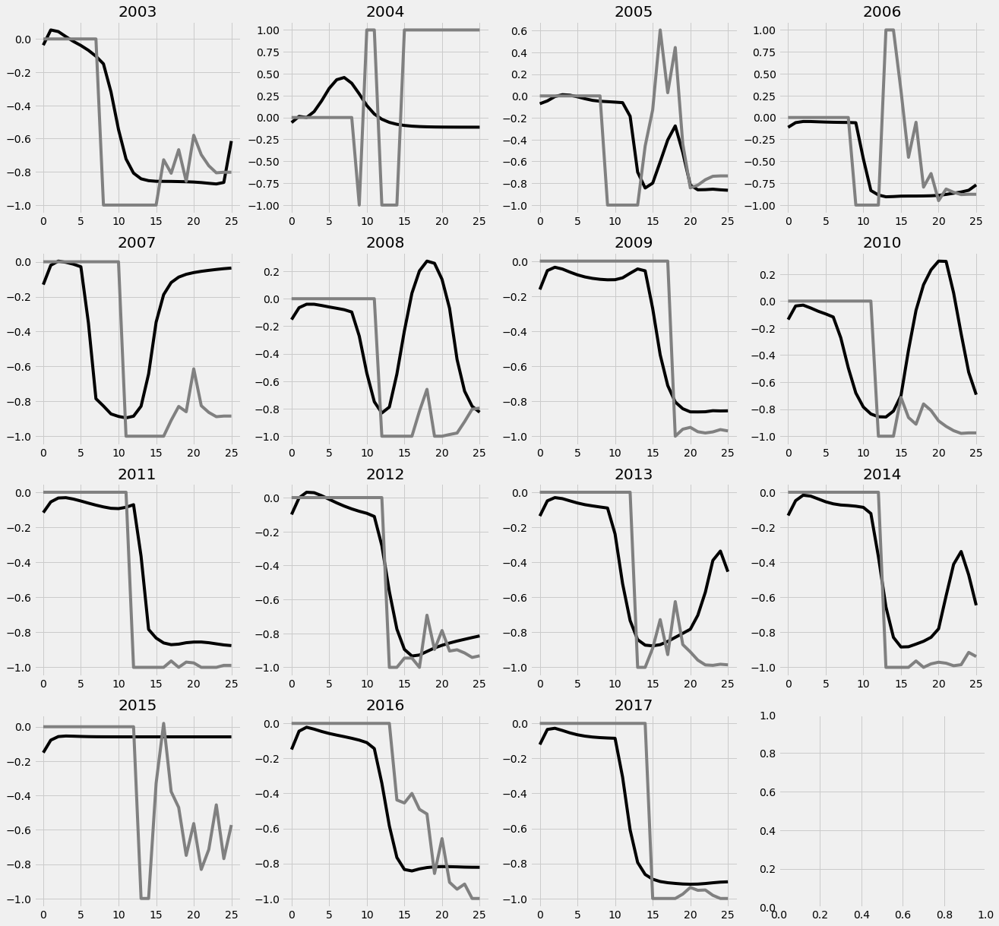

In [58]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale_nan = np.nan_to_num(X_scale)

# Augmenting training data - X
X_reverse_time = reverse_time_series(X_scale_nan)
X_reverse_magnitude = X_scale_nan * -1
X_reverse_both = reverse_time_series(X_scale_nan) * -1

# X_augmented = np.concatenate([X_scale_nan, X_reverse_time, X_reverse_magnitude, X_reverse_both])
X_augmented = np.concatenate([X_scale_nan, X_reverse_time])

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
# Y_scale = np.nan_to_num(Y_scale)
Y_scale_nan = np.nan_to_num(Y_scale)

# Augmenting training data - Y
Y_reverse_time = reverse_time_series(Y_scale_nan)
Y_reverse_magnitude = Y_scale_nan * -1
Y_reverse_both = reverse_time_series(Y_scale_nan) * -1

# Y_augmented = np.concatenate([Y_scale_nan, Y_reverse_time, Y_reverse_magnitude, Y_reverse_both])
Y_augmented = np.concatenate([Y_scale_nan, Y_reverse_time])

fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
ymax = 0
for j, year in enumerate(analysis_years):
    model = tf.keras.models.Sequential()

    model.add(tf.keras.layers.LSTM(64, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(rate=0.2))

    model.add(tf.keras.layers.Dense(64))
    model.add(tf.keras.layers.Dropout(rate=0.5))

    model.add(tf.keras.layers.LSTM(32, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(rate=0.2))

    model.add(tf.keras.layers.Dense(32))
    model.add(tf.keras.layers.Dropout(rate=0.5))
    
    model.add(tf.keras.layers.LSTM(16, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(rate=0.2))

    model.add(tf.keras.layers.Dense(16))
    model.add(tf.keras.layers.Dropout(rate=0.5))
    
    model.add(tf.keras.layers.LSTM(8, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(rate=0.2))

    model.add(tf.keras.layers.Dense(16))
    model.add(tf.keras.layers.Dropout(rate=0.5))

    model.add(tf.keras.layers.Dense(1))

    model.compile(optimizer='adam', 
                  loss='mse')
    ind = np.ones((len(analysis_years) * 2,), bool)
    ind[j] = False
    train_X = np.nan_to_num(X_augmented[ind])
    train_Y = np.nan_to_num(Y_augmented[ind])

    test_X = np.nan_to_num(X_augmented[j].reshape(1, X_augmented.shape[1], X_augmented.shape[2]))
    test_Y = np.nan_to_num(Y_augmented[j].reshape(1, Y_augmented.shape[1], Y_augmented.shape[2]))
    
    history = model.fit(train_X, train_Y, 
                    epochs=1000, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    
#     plot_predictions = scalers_y[j].inverse_transform(convert_zero_to_nan(test_predictions[0]))
#     plot_true = scalers_y[j].inverse_transform(convert_zero_to_nan(test_Y[0]))
    
#     ymax = max(ymax, max(max(plot_predictions), max(plot_true)))
    
#     ax[jx].plot(plot_predictions, color='black')
#     ax[jx].plot(plot_true, color='gray')
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

##### MAE

/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt

Epoch 1/2000
14/14 [==============================] - 17s 1s/sample - loss: 0.4569
Epoch 2/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.4514
Epoch 3/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.4427
Epoch 4/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.4278
Epoch 5/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.4159
Epoch 6/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3795
Epoch 7/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3433
Epoch 8/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3183
Epoch 9/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3373
Epoch 10/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3476
Epoch 11/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3154
Epoch 12/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2997
E

Epoch 99/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2180
Epoch 100/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2197
Epoch 101/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2230
Epoch 102/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2326
Epoch 103/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2237
Epoch 104/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2215
Epoch 105/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2323
Epoch 106/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2182
Epoch 107/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2230
Epoch 108/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2224
Epoch 109/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2308
Epoch 110/2000
14/14 [==============================] - 0s 5ms/sam

Epoch 196/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1861
Epoch 197/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1781
Epoch 198/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1781
Epoch 199/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1843
Epoch 200/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1958
Epoch 201/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1912
Epoch 202/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1961
Epoch 203/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1876
Epoch 204/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1846
Epoch 205/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1932
Epoch 206/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1803
Epoch 207/2000
14/14 [==============================] - 0s 4ms/sa

Epoch 293/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1581
Epoch 294/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1688
Epoch 295/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1679
Epoch 296/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1625
Epoch 297/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1576
Epoch 298/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1673
Epoch 299/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1551
Epoch 300/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1558
Epoch 301/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1642
Epoch 302/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1701
Epoch 303/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1646
Epoch 304/2000
14/14 [==============================] - 0s 4ms/sa

Epoch 390/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1577
Epoch 391/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1472
Epoch 392/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1577
Epoch 393/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1495
Epoch 394/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1533
Epoch 395/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1568
Epoch 396/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1511
Epoch 397/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1449
Epoch 398/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1520
Epoch 399/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1488
Epoch 400/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1490
Epoch 401/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 487/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1474
Epoch 488/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1441
Epoch 489/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1362
Epoch 490/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1450
Epoch 491/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1459
Epoch 492/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1419
Epoch 493/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1426
Epoch 494/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1356
Epoch 495/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1430
Epoch 496/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1400
Epoch 497/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1485
Epoch 498/2000
14/14 [==============================] - 0s 4ms/sa

Epoch 584/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1321
Epoch 585/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1332
Epoch 586/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1245
Epoch 587/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1300
Epoch 588/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1348
Epoch 589/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1334
Epoch 590/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1279
Epoch 591/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1332
Epoch 592/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1334
Epoch 593/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1321
Epoch 594/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1239
Epoch 595/2000
14/14 [==============================] - 0s 4ms/sa

Epoch 681/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1261
Epoch 682/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1292
Epoch 683/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1374
Epoch 684/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1331
Epoch 685/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1174
Epoch 686/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1221
Epoch 687/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1212
Epoch 688/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1232
Epoch 689/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1255
Epoch 690/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1287
Epoch 691/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1236
Epoch 692/2000
14/14 [==============================] - 0s 4ms/sa

Epoch 778/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1223
Epoch 779/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1313
Epoch 780/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1194
Epoch 781/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1226
Epoch 782/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1278
Epoch 783/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1129
Epoch 784/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1217
Epoch 785/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1236
Epoch 786/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1268
Epoch 787/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1215
Epoch 788/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1269
Epoch 789/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 875/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1156
Epoch 876/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1209
Epoch 877/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1229
Epoch 878/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1135
Epoch 879/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1111
Epoch 880/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1251
Epoch 881/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1159
Epoch 882/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1179
Epoch 883/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1226
Epoch 884/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1210
Epoch 885/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1124
Epoch 886/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 972/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1205
Epoch 973/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1221
Epoch 974/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1196
Epoch 975/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1215
Epoch 976/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1203
Epoch 977/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1170
Epoch 978/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1235
Epoch 979/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1148
Epoch 980/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1096
Epoch 981/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1126
Epoch 982/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1165
Epoch 983/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 1068/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1146
Epoch 1069/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1125
Epoch 1070/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1216
Epoch 1071/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1141
Epoch 1072/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1158
Epoch 1073/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1253
Epoch 1074/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1169
Epoch 1075/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1128
Epoch 1076/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1154
Epoch 1077/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1105
Epoch 1078/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1207
Epoch 1079/2000
14/14 [==============================]

Epoch 1164/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1172
Epoch 1165/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1237
Epoch 1166/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1221
Epoch 1167/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1177
Epoch 1168/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1176
Epoch 1169/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1084
Epoch 1170/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1222
Epoch 1171/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1134
Epoch 1172/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1097
Epoch 1173/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1097
Epoch 1174/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1148
Epoch 1175/2000
14/14 [==============================]

Epoch 1260/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1185
Epoch 1261/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1128
Epoch 1262/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1087
Epoch 1263/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1105
Epoch 1264/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1156
Epoch 1265/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1129
Epoch 1266/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1137
Epoch 1267/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1106
Epoch 1268/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1187
Epoch 1269/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1236
Epoch 1270/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1172
Epoch 1271/2000
14/14 [==============================]

Epoch 1356/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1145
Epoch 1357/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1172
Epoch 1358/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1150
Epoch 1359/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1193
Epoch 1360/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1100
Epoch 1361/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1093
Epoch 1362/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1134
Epoch 1363/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1082
Epoch 1364/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1138
Epoch 1365/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1131
Epoch 1366/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1196
Epoch 1367/2000
14/14 [==============================]

Epoch 1452/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1162
Epoch 1453/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1112
Epoch 1454/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1153
Epoch 1455/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1187
Epoch 1456/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1110
Epoch 1457/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1138
Epoch 1458/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1154
Epoch 1459/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1189
Epoch 1460/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1236
Epoch 1461/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1162
Epoch 1462/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1104
Epoch 1463/2000
14/14 [==============================]

Epoch 1548/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1200
Epoch 1549/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1166
Epoch 1550/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1275
Epoch 1551/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1289
Epoch 1552/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1183
Epoch 1553/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1172
Epoch 1554/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1162
Epoch 1555/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1203
Epoch 1556/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1107
Epoch 1557/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1128
Epoch 1558/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1232
Epoch 1559/2000
14/14 [==============================]

Epoch 1644/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1049
Epoch 1645/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1115
Epoch 1646/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1102
Epoch 1647/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1078
Epoch 1648/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1093
Epoch 1649/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1107
Epoch 1650/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1141
Epoch 1651/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1079
Epoch 1652/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1131
Epoch 1653/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1132
Epoch 1654/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1042
Epoch 1655/2000
14/14 [==============================]

Epoch 1740/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1054
Epoch 1741/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1122
Epoch 1742/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1142
Epoch 1743/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1053
Epoch 1744/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1066
Epoch 1745/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1203
Epoch 1746/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1109
Epoch 1747/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1168
Epoch 1748/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1164
Epoch 1749/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1133
Epoch 1750/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1102
Epoch 1751/2000
14/14 [==============================]

Epoch 1836/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1154
Epoch 1837/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1209
Epoch 1838/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1077
Epoch 1839/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1039
Epoch 1840/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1070
Epoch 1841/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1131
Epoch 1842/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1054
Epoch 1843/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0977
Epoch 1844/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1064
Epoch 1845/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1101
Epoch 1846/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1130
Epoch 1847/2000
14/14 [==============================]

Epoch 1932/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1032
Epoch 1933/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1123
Epoch 1934/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0990
Epoch 1935/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1033
Epoch 1936/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1057
Epoch 1937/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1004
Epoch 1938/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1115
Epoch 1939/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1060
Epoch 1940/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1109
Epoch 1941/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1108
Epoch 1942/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1110
Epoch 1943/2000
14/14 [==============================]

Epoch 27/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2450
Epoch 28/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2544
Epoch 29/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2448
Epoch 30/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2515
Epoch 31/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2400
Epoch 32/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2275
Epoch 33/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2426
Epoch 34/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2172
Epoch 35/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2437
Epoch 36/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2366
Epoch 37/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2298
Epoch 38/2000
14/14 [==============================] - 0s 5ms/sample - loss:

Epoch 125/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1814
Epoch 126/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1837
Epoch 127/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1883
Epoch 128/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1921
Epoch 129/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1828
Epoch 130/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1953
Epoch 131/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1891
Epoch 132/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1877
Epoch 133/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1854
Epoch 134/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1713
Epoch 135/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1829
Epoch 136/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 222/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1481
Epoch 223/2000
14/14 [==============================] - 0s 8ms/sample - loss: 0.1602
Epoch 224/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1554
Epoch 225/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1625
Epoch 226/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1670
Epoch 227/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1547
Epoch 228/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1486
Epoch 229/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1583
Epoch 230/2000
14/14 [==============================] - 0s 8ms/sample - loss: 0.1517
Epoch 231/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1492
Epoch 232/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1518
Epoch 233/2000
14/14 [==============================] - 0s 7ms/sa

Epoch 319/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1496
Epoch 320/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1390
Epoch 321/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1425
Epoch 322/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1290
Epoch 323/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1371
Epoch 324/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1374
Epoch 325/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1333
Epoch 326/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1433
Epoch 327/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1362
Epoch 328/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1287
Epoch 329/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1392
Epoch 330/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 416/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1347
Epoch 417/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1301
Epoch 418/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1225
Epoch 419/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1241
Epoch 420/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1252
Epoch 421/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1200
Epoch 422/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1261
Epoch 423/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1295
Epoch 424/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1250
Epoch 425/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1210
Epoch 426/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1200
Epoch 427/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 513/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1305
Epoch 514/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1265
Epoch 515/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1286
Epoch 516/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1280
Epoch 517/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1186
Epoch 518/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1166
Epoch 519/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1265
Epoch 520/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1301
Epoch 521/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1265
Epoch 522/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1278
Epoch 523/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1257
Epoch 524/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 610/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1178
Epoch 611/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1229
Epoch 612/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1243
Epoch 613/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1229
Epoch 614/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1281
Epoch 615/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1139
Epoch 616/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1106
Epoch 617/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1301
Epoch 618/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1193
Epoch 619/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1213
Epoch 620/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1219
Epoch 621/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 707/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1141
Epoch 708/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1175
Epoch 709/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1189
Epoch 710/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1122
Epoch 711/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1199
Epoch 712/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1204
Epoch 713/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1175
Epoch 714/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1306
Epoch 715/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1137
Epoch 716/2000
14/14 [==============================] - 0s 8ms/sample - loss: 0.1100
Epoch 717/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1177
Epoch 718/2000
14/14 [==============================] - 0s 6ms/sa

Epoch 804/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1202
Epoch 805/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1130
Epoch 806/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1084
Epoch 807/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1221
Epoch 808/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1134
Epoch 809/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1209
Epoch 810/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1185
Epoch 811/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1128
Epoch 812/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1159
Epoch 813/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1093
Epoch 814/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1128
Epoch 815/2000
14/14 [==============================] - 0s 7ms/sa

Epoch 901/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1139
Epoch 902/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1191
Epoch 903/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1155
Epoch 904/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1070
Epoch 905/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1179
Epoch 906/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1151
Epoch 907/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1070
Epoch 908/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1073
Epoch 909/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1080
Epoch 910/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1126
Epoch 911/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1232
Epoch 912/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 998/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1132
Epoch 999/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1237
Epoch 1000/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1160
Epoch 1001/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1088
Epoch 1002/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1125
Epoch 1003/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1193
Epoch 1004/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1296
Epoch 1005/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1198
Epoch 1006/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1161
Epoch 1007/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1136
Epoch 1008/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1156
Epoch 1009/2000
14/14 [==============================] -

Epoch 1094/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1129
Epoch 1095/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1155
Epoch 1096/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1098
Epoch 1097/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1087
Epoch 1098/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1086
Epoch 1099/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1094
Epoch 1100/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1206
Epoch 1101/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1117
Epoch 1102/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1198
Epoch 1103/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1090
Epoch 1104/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1130
Epoch 1105/2000
14/14 [==============================]

Epoch 1190/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1025
Epoch 1191/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1074
Epoch 1192/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1023
Epoch 1193/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1036
Epoch 1194/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1102
Epoch 1195/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1094
Epoch 1196/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1182
Epoch 1197/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1061
Epoch 1198/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1031
Epoch 1199/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1058
Epoch 1200/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1079
Epoch 1201/2000
14/14 [==============================]

Epoch 1286/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1260
Epoch 1287/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1179
Epoch 1288/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1089
Epoch 1289/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1112
Epoch 1290/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1063
Epoch 1291/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1232
Epoch 1292/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1118
Epoch 1293/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1110
Epoch 1294/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1055
Epoch 1295/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1209
Epoch 1296/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1204
Epoch 1297/2000
14/14 [==============================]

Epoch 1382/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1119
Epoch 1383/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1030
Epoch 1384/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1124
Epoch 1385/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1106
Epoch 1386/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1022
Epoch 1387/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1109
Epoch 1388/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1061
Epoch 1389/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1077
Epoch 1390/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1035
Epoch 1391/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1055
Epoch 1392/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1083
Epoch 1393/2000
14/14 [==============================]

Epoch 1478/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1060
Epoch 1479/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1194
Epoch 1480/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1117
Epoch 1481/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1086
Epoch 1482/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1124
Epoch 1483/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1094
Epoch 1484/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1045
Epoch 1485/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1079
Epoch 1486/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1029
Epoch 1487/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1038
Epoch 1488/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1046
Epoch 1489/2000
14/14 [==============================]

Epoch 1574/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1052
Epoch 1575/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1046
Epoch 1576/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1139
Epoch 1577/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1066
Epoch 1578/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1090
Epoch 1579/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0992
Epoch 1580/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1024
Epoch 1581/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1018
Epoch 1582/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1160
Epoch 1583/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1091
Epoch 1584/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1041
Epoch 1585/2000
14/14 [==============================]

Epoch 1670/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1115
Epoch 1671/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1098
Epoch 1672/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1127
Epoch 1673/2000
14/14 [==============================] - 0s 8ms/sample - loss: 0.1019
Epoch 1674/2000
14/14 [==============================] - 0s 9ms/sample - loss: 0.1003
Epoch 1675/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1018
Epoch 1676/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1180
Epoch 1677/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1079
Epoch 1678/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1145
Epoch 1679/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1185
Epoch 1680/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1099
Epoch 1681/2000
14/14 [==============================]

Epoch 1766/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1000
Epoch 1767/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1079
Epoch 1768/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1024
Epoch 1769/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1098
Epoch 1770/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1086
Epoch 1771/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1026
Epoch 1772/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1029
Epoch 1773/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1141
Epoch 1774/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1010
Epoch 1775/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0984
Epoch 1776/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1100
Epoch 1777/2000
14/14 [==============================]

Epoch 1862/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1080
Epoch 1863/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1069
Epoch 1864/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1009
Epoch 1865/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1083
Epoch 1866/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1044
Epoch 1867/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1160
Epoch 1868/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1051
Epoch 1869/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0989
Epoch 1870/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0943
Epoch 1871/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1036
Epoch 1872/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1076
Epoch 1873/2000
14/14 [==============================]

Epoch 1958/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1028
Epoch 1959/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0986
Epoch 1960/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1056
Epoch 1961/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1056
Epoch 1962/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1076
Epoch 1963/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1032
Epoch 1964/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1040
Epoch 1965/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1037
Epoch 1966/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1087
Epoch 1967/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1125
Epoch 1968/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1070
Epoch 1969/2000
14/14 [==============================]

Epoch 54/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2508
Epoch 55/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2408
Epoch 56/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2438
Epoch 57/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2486
Epoch 58/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2322
Epoch 59/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2290
Epoch 60/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2375
Epoch 61/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2364
Epoch 62/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2301
Epoch 63/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2413
Epoch 64/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2309
Epoch 65/2000
14/14 [==============================] - 0s 5ms/sample - loss:

Epoch 151/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1866
Epoch 152/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1755
Epoch 153/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1902
Epoch 154/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1851
Epoch 155/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1898
Epoch 156/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1797
Epoch 157/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1847
Epoch 158/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1742
Epoch 159/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1851
Epoch 160/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1816
Epoch 161/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1824
Epoch 162/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 248/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1438
Epoch 249/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1539
Epoch 250/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1630
Epoch 251/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1523
Epoch 252/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1608
Epoch 253/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1526
Epoch 254/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1504
Epoch 255/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1551
Epoch 256/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1450
Epoch 257/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1515
Epoch 258/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1525
Epoch 259/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 345/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1398
Epoch 346/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1405
Epoch 347/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1324
Epoch 348/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1433
Epoch 349/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1395
Epoch 350/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1406
Epoch 351/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1405
Epoch 352/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1370
Epoch 353/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1408
Epoch 354/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1456
Epoch 355/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1367
Epoch 356/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 442/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1388
Epoch 443/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1267
Epoch 444/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1330
Epoch 445/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1304
Epoch 446/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1311
Epoch 447/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1444
Epoch 448/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1264
Epoch 449/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1417
Epoch 450/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1283
Epoch 451/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1305
Epoch 452/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1157
Epoch 453/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 539/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1302
Epoch 540/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1182
Epoch 541/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1237
Epoch 542/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1280
Epoch 543/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1242
Epoch 544/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1336
Epoch 545/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1312
Epoch 546/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1282
Epoch 547/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1304
Epoch 548/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1243
Epoch 549/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1258
Epoch 550/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 636/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1244
Epoch 637/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1309
Epoch 638/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1286
Epoch 639/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1204
Epoch 640/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1233
Epoch 641/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1202
Epoch 642/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1261
Epoch 643/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1228
Epoch 644/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1226
Epoch 645/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1248
Epoch 646/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1288
Epoch 647/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 733/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1215
Epoch 734/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1266
Epoch 735/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1186
Epoch 736/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1237
Epoch 737/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1181
Epoch 738/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1202
Epoch 739/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1206
Epoch 740/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1236
Epoch 741/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1176
Epoch 742/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1240
Epoch 743/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1190
Epoch 744/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 830/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1173
Epoch 831/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1139
Epoch 832/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1208
Epoch 833/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1201
Epoch 834/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1182
Epoch 835/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1132
Epoch 836/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1192
Epoch 837/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1177
Epoch 838/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1160
Epoch 839/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1172
Epoch 840/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1174
Epoch 841/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 927/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1307
Epoch 928/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1154
Epoch 929/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1156
Epoch 930/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1163
Epoch 931/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1062
Epoch 932/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1106
Epoch 933/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1104
Epoch 934/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1136
Epoch 935/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1199
Epoch 936/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1117
Epoch 937/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1115
Epoch 938/2000
14/14 [==============================] - 0s 5ms/sa

14/14 [==============================] - 0s 7ms/sample - loss: 0.1116
Epoch 1024/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1169
Epoch 1025/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1155
Epoch 1026/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1135
Epoch 1027/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1149
Epoch 1028/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1091
Epoch 1029/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1115
Epoch 1030/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1125
Epoch 1031/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1144
Epoch 1032/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1110
Epoch 1033/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1057
Epoch 1034/2000
14/14 [==============================] - 0s 6ms/sample

Epoch 1119/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1034
Epoch 1120/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1179
Epoch 1121/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1126
Epoch 1122/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1175
Epoch 1123/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1116
Epoch 1124/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1159
Epoch 1125/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1105
Epoch 1126/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1058
Epoch 1127/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1170
Epoch 1128/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1155
Epoch 1129/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1128
Epoch 1130/2000
14/14 [==============================]

Epoch 1215/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1084
Epoch 1216/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1105
Epoch 1217/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1002
Epoch 1218/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1091
Epoch 1219/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0997
Epoch 1220/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1133
Epoch 1221/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1130
Epoch 1222/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1151
Epoch 1223/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1061
Epoch 1224/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1011
Epoch 1225/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1029
Epoch 1226/2000
14/14 [==============================]

Epoch 1311/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1114
Epoch 1312/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1098
Epoch 1313/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1052
Epoch 1314/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1031
Epoch 1315/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1014
Epoch 1316/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1096
Epoch 1317/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1003
Epoch 1318/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1054
Epoch 1319/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1039
Epoch 1320/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1116
Epoch 1321/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1098
Epoch 1322/2000
14/14 [==============================]

Epoch 1407/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1059
Epoch 1408/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1044
Epoch 1409/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1076
Epoch 1410/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1006
Epoch 1411/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1088
Epoch 1412/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1061
Epoch 1413/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1097
Epoch 1414/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1043
Epoch 1415/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1093
Epoch 1416/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1078
Epoch 1417/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1181
Epoch 1418/2000
14/14 [==============================]

Epoch 1503/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1017
Epoch 1504/2000
14/14 [==============================] - 0s 9ms/sample - loss: 0.0973
Epoch 1505/2000
14/14 [==============================] - 0s 9ms/sample - loss: 0.1083
Epoch 1506/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.0982
Epoch 1507/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1035
Epoch 1508/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1050
Epoch 1509/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1015
Epoch 1510/2000
14/14 [==============================] - 0s 8ms/sample - loss: 0.0982
Epoch 1511/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1010
Epoch 1512/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1065
Epoch 1513/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1011
Epoch 1514/2000
14/14 [==============================]

Epoch 1599/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1001
Epoch 1600/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1047
Epoch 1601/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1027
Epoch 1602/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0947
Epoch 1603/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1080
Epoch 1604/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1068
Epoch 1605/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1034
Epoch 1606/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1007
Epoch 1607/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0991
Epoch 1608/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1091
Epoch 1609/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0987
Epoch 1610/2000
14/14 [==============================]

Epoch 1695/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0992
Epoch 1696/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0999
Epoch 1697/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0975
Epoch 1698/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1037
Epoch 1699/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1020
Epoch 1700/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1069
Epoch 1701/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1044
Epoch 1702/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1159
Epoch 1703/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1117
Epoch 1704/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1058
Epoch 1705/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1039
Epoch 1706/2000
14/14 [==============================]

Epoch 1791/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1010
Epoch 1792/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1024
Epoch 1793/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1137
Epoch 1794/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1083
Epoch 1795/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1182
Epoch 1796/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1114
Epoch 1797/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1068
Epoch 1798/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1048
Epoch 1799/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0991
Epoch 1800/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0990
Epoch 1801/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1040
Epoch 1802/2000
14/14 [==============================]

Epoch 1887/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1127
Epoch 1888/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1009
Epoch 1889/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1000
Epoch 1890/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0984
Epoch 1891/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1018
Epoch 1892/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0979
Epoch 1893/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0915
Epoch 1894/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0984
Epoch 1895/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1019
Epoch 1896/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0945
Epoch 1897/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0864
Epoch 1898/2000
14/14 [==============================]

Epoch 1983/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0967
Epoch 1984/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0999
Epoch 1985/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0906
Epoch 1986/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1028
Epoch 1987/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0982
Epoch 1988/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0983
Epoch 1989/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1037
Epoch 1990/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0960
Epoch 1991/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1009
Epoch 1992/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1064
Epoch 1993/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1184
Epoch 1994/2000
14/14 [==============================]

Epoch 79/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.2151
Epoch 80/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.2125
Epoch 81/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.2158
Epoch 82/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.2231
Epoch 83/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.2208
Epoch 84/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.2264
Epoch 85/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.2153
Epoch 86/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.2138
Epoch 87/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.2145
Epoch 88/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.2103
Epoch 89/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2268
Epoch 90/2000
14/14 [==============================] - 0s 6ms/sample - loss:

Epoch 176/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1587
Epoch 177/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1614
Epoch 178/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1631
Epoch 179/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1731
Epoch 180/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1638
Epoch 181/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1698
Epoch 182/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1555
Epoch 183/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1712
Epoch 184/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1629
Epoch 185/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1651
Epoch 186/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1706
Epoch 187/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 273/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1413
Epoch 274/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1544
Epoch 275/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1395
Epoch 276/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1367
Epoch 277/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1389
Epoch 278/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1431
Epoch 279/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1494
Epoch 280/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1500
Epoch 281/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1574
Epoch 282/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1413
Epoch 283/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1328
Epoch 284/2000
14/14 [==============================] - 0s 6ms/sa

Epoch 370/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1351
Epoch 371/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1295
Epoch 372/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1350
Epoch 373/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1387
Epoch 374/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1351
Epoch 375/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1296
Epoch 376/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1201
Epoch 377/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1335
Epoch 378/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1355
Epoch 379/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1374
Epoch 380/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1282
Epoch 381/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 467/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1233
Epoch 468/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1184
Epoch 469/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1225
Epoch 470/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1228
Epoch 471/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1226
Epoch 472/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1197
Epoch 473/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1225
Epoch 474/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1298
Epoch 475/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1222
Epoch 476/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1277
Epoch 477/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1242
Epoch 478/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 564/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1239
Epoch 565/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1262
Epoch 566/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1209
Epoch 567/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1286
Epoch 568/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1159
Epoch 569/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1196
Epoch 570/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1200
Epoch 571/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1312
Epoch 572/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1217
Epoch 573/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1161
Epoch 574/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1262
Epoch 575/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 661/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1104
Epoch 662/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1123
Epoch 663/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1145
Epoch 664/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1183
Epoch 665/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1097
Epoch 666/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1063
Epoch 667/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1021
Epoch 668/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1004
Epoch 669/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1112
Epoch 670/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1131
Epoch 671/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1103
Epoch 672/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 758/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1071
Epoch 759/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1025
Epoch 760/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1044
Epoch 761/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1166
Epoch 762/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1192
Epoch 763/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1110
Epoch 764/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1151
Epoch 765/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1089
Epoch 766/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1099
Epoch 767/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1003
Epoch 768/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1217
Epoch 769/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 855/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1150
Epoch 856/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1120
Epoch 857/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1055
Epoch 858/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1065
Epoch 859/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1039
Epoch 860/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1073
Epoch 861/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0986
Epoch 862/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1081
Epoch 863/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1058
Epoch 864/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1001
Epoch 865/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1023
Epoch 866/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 952/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1019
Epoch 953/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1045
Epoch 954/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1024
Epoch 955/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1029
Epoch 956/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1043
Epoch 957/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1008
Epoch 958/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0914
Epoch 959/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1057
Epoch 960/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0962
Epoch 961/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0977
Epoch 962/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1111
Epoch 963/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 1048/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.0949
Epoch 1049/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1007
Epoch 1050/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1075
Epoch 1051/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0955
Epoch 1052/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.0984
Epoch 1053/2000
14/14 [==============================] - 0s 7ms/sample - loss: 0.1086
Epoch 1054/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.0990
Epoch 1055/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1057
Epoch 1056/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.0997
Epoch 1057/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1064
Epoch 1058/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.0978
Epoch 1059/2000
14/14 [==============================]

Epoch 1144/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0984
Epoch 1145/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1073
Epoch 1146/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1176
Epoch 1147/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1166
Epoch 1148/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0960
Epoch 1149/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0974
Epoch 1150/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1103
Epoch 1151/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1253
Epoch 1152/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1115
Epoch 1153/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1066
Epoch 1154/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1031
Epoch 1155/2000
14/14 [==============================]

Epoch 1240/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1037
Epoch 1241/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1003
Epoch 1242/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0917
Epoch 1243/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1013
Epoch 1244/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0965
Epoch 1245/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0962
Epoch 1246/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1035
Epoch 1247/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1013
Epoch 1248/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1059
Epoch 1249/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1001
Epoch 1250/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0992
Epoch 1251/2000
14/14 [==============================]

Epoch 1336/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0911
Epoch 1337/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0915
Epoch 1338/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0903
Epoch 1339/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0971
Epoch 1340/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0892
Epoch 1341/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0971
Epoch 1342/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1042
Epoch 1343/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1000
Epoch 1344/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0901
Epoch 1345/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0945
Epoch 1346/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0906
Epoch 1347/2000
14/14 [==============================]

Epoch 1432/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0989
Epoch 1433/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1025
Epoch 1434/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0943
Epoch 1435/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0951
Epoch 1436/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1018
Epoch 1437/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0934
Epoch 1438/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0918
Epoch 1439/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0967
Epoch 1440/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0981
Epoch 1441/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0946
Epoch 1442/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1010
Epoch 1443/2000
14/14 [==============================]

Epoch 1528/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0958
Epoch 1529/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0938
Epoch 1530/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1062
Epoch 1531/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1113
Epoch 1532/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1177
Epoch 1533/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1119
Epoch 1534/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1170
Epoch 1535/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1006
Epoch 1536/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1059
Epoch 1537/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1032
Epoch 1538/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0962
Epoch 1539/2000
14/14 [==============================]

Epoch 1624/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0877
Epoch 1625/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0924
Epoch 1626/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0913
Epoch 1627/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0887
Epoch 1628/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0911
Epoch 1629/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0965
Epoch 1630/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0909
Epoch 1631/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0965
Epoch 1632/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0926
Epoch 1633/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0900
Epoch 1634/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0938
Epoch 1635/2000
14/14 [==============================]

Epoch 1720/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0927
Epoch 1721/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0925
Epoch 1722/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0896
Epoch 1723/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0866
Epoch 1724/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0871
Epoch 1725/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0887
Epoch 1726/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0861
Epoch 1727/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1033
Epoch 1728/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0944
Epoch 1729/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0881
Epoch 1730/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0955
Epoch 1731/2000
14/14 [==============================]

Epoch 1816/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0895
Epoch 1817/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0860
Epoch 1818/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0800
Epoch 1819/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0928
Epoch 1820/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0932
Epoch 1821/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0845
Epoch 1822/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0875
Epoch 1823/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0878
Epoch 1824/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0923
Epoch 1825/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0873
Epoch 1826/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0887
Epoch 1827/2000
14/14 [==============================]

Epoch 1912/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0875
Epoch 1913/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0952
Epoch 1914/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0876
Epoch 1915/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0961
Epoch 1916/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0959
Epoch 1917/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0900
Epoch 1918/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0938
Epoch 1919/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0886
Epoch 1920/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0873
Epoch 1921/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0829
Epoch 1922/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.0910
Epoch 1923/2000
14/14 [==============================]

14/14 [==============================] - 0s 5ms/sample - loss: 0.3887
Epoch 7/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3518
Epoch 8/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3339
Epoch 9/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.3271
Epoch 10/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.3279
Epoch 11/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2971
Epoch 12/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.3082
Epoch 13/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2971
Epoch 14/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2845
Epoch 15/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.3031
Epoch 16/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2906
Epoch 17/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2720
Epoch 18/

Epoch 104/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2196
Epoch 105/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2257
Epoch 106/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2144
Epoch 107/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2209
Epoch 108/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2133
Epoch 109/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2147
Epoch 110/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2239
Epoch 111/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2229
Epoch 112/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2546
Epoch 113/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.2130
Epoch 114/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.2064
Epoch 115/2000
14/14 [==============================] - 0s 4ms/sa

Epoch 201/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1865
Epoch 202/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1840
Epoch 203/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1775
Epoch 204/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1928
Epoch 205/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1826
Epoch 206/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1872
Epoch 207/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1761
Epoch 208/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1863
Epoch 209/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1997
Epoch 210/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1808
Epoch 211/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1858
Epoch 212/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 298/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1702
Epoch 299/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1642
Epoch 300/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1596
Epoch 301/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1765
Epoch 302/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1706
Epoch 303/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1626
Epoch 304/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1660
Epoch 305/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1738
Epoch 306/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1709
Epoch 307/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1693
Epoch 308/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1675
Epoch 309/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 395/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1529
Epoch 396/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1540
Epoch 397/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1530
Epoch 398/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1444
Epoch 399/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1487
Epoch 400/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1398
Epoch 401/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1480
Epoch 402/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1517
Epoch 403/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1453
Epoch 404/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1511
Epoch 405/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1475
Epoch 406/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 492/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1435
Epoch 493/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1358
Epoch 494/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1370
Epoch 495/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1506
Epoch 496/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1470
Epoch 497/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1430
Epoch 498/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1312
Epoch 499/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1448
Epoch 500/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1418
Epoch 501/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1351
Epoch 502/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1362
Epoch 503/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 589/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1281
Epoch 590/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1343
Epoch 591/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1381
Epoch 592/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1343
Epoch 593/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1312
Epoch 594/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1293
Epoch 595/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1353
Epoch 596/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1308
Epoch 597/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1337
Epoch 598/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1337
Epoch 599/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1310
Epoch 600/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 686/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1313
Epoch 687/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1236
Epoch 688/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1128
Epoch 689/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1322
Epoch 690/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1268
Epoch 691/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1236
Epoch 692/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1240
Epoch 693/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1388
Epoch 694/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1306
Epoch 695/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1295
Epoch 696/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1176
Epoch 697/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 783/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1301
Epoch 784/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1319
Epoch 785/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1293
Epoch 786/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1274
Epoch 787/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1182
Epoch 788/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1146
Epoch 789/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1205
Epoch 790/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1195
Epoch 791/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1164
Epoch 792/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1311
Epoch 793/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1188
Epoch 794/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 880/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1125
Epoch 881/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1122
Epoch 882/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1157
Epoch 883/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1124
Epoch 884/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1093
Epoch 885/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1107
Epoch 886/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1179
Epoch 887/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1242
Epoch 888/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1161
Epoch 889/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1193
Epoch 890/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1223
Epoch 891/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 977/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1156
Epoch 978/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1173
Epoch 979/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1106
Epoch 980/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1081
Epoch 981/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1210
Epoch 982/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1193
Epoch 983/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1161
Epoch 984/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1106
Epoch 985/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1094
Epoch 986/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1227
Epoch 987/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1033
Epoch 988/2000
14/14 [==============================] - 0s 5ms/sa

Epoch 1073/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1156
Epoch 1074/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1122
Epoch 1075/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1116
Epoch 1076/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1123
Epoch 1077/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1082
Epoch 1078/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1061
Epoch 1079/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1067
Epoch 1080/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1219
Epoch 1081/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1105
Epoch 1082/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1097
Epoch 1083/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1043
Epoch 1084/2000
14/14 [==============================]

Epoch 1169/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1097
Epoch 1170/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1018
Epoch 1171/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1115
Epoch 1172/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0995
Epoch 1173/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1100
Epoch 1174/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1059
Epoch 1175/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0965
Epoch 1176/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1056
Epoch 1177/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1084
Epoch 1178/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1044
Epoch 1179/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0999
Epoch 1180/2000
14/14 [==============================]

Epoch 1265/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1043
Epoch 1266/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1028
Epoch 1267/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1136
Epoch 1268/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1074
Epoch 1269/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1011
Epoch 1270/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1085
Epoch 1271/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1055
Epoch 1272/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0948
Epoch 1273/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0954
Epoch 1274/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1097
Epoch 1275/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1124
Epoch 1276/2000
14/14 [==============================]

Epoch 1361/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0971
Epoch 1362/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1060
Epoch 1363/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1088
Epoch 1364/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1026
Epoch 1365/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1077
Epoch 1366/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1079
Epoch 1367/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1078
Epoch 1368/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1037
Epoch 1369/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1017
Epoch 1370/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1081
Epoch 1371/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0941
Epoch 1372/2000
14/14 [==============================]

Epoch 1457/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1025
Epoch 1458/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1036
Epoch 1459/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1099
Epoch 1460/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0977
Epoch 1461/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1028
Epoch 1462/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1009
Epoch 1463/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1023
Epoch 1464/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0916
Epoch 1465/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0960
Epoch 1466/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0949
Epoch 1467/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1056
Epoch 1468/2000
14/14 [==============================]

Epoch 1553/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1103
Epoch 1554/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1051
Epoch 1555/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0986
Epoch 1556/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1007
Epoch 1557/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1061
Epoch 1558/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0949
Epoch 1559/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0990
Epoch 1560/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0932
Epoch 1561/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1010
Epoch 1562/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0880
Epoch 1563/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0932
Epoch 1564/2000
14/14 [==============================]

Epoch 1649/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0974
Epoch 1650/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1008
Epoch 1651/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1032
Epoch 1652/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0958
Epoch 1653/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0951
Epoch 1654/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0991
Epoch 1655/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0928
Epoch 1656/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1005
Epoch 1657/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1005
Epoch 1658/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0959
Epoch 1659/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0952
Epoch 1660/2000
14/14 [==============================]

Epoch 1745/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0906
Epoch 1746/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1073
Epoch 1747/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1023
Epoch 1748/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1047
Epoch 1749/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0984
Epoch 1750/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1014
Epoch 1751/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1047
Epoch 1752/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0937
Epoch 1753/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1065
Epoch 1754/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1081
Epoch 1755/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1004
Epoch 1756/2000
14/14 [==============================]

Epoch 1841/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0992
Epoch 1842/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0867
Epoch 1843/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0900
Epoch 1844/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1006
Epoch 1845/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1020
Epoch 1846/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1009
Epoch 1847/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0937
Epoch 1848/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0927
Epoch 1849/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0910
Epoch 1850/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0943
Epoch 1851/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0906
Epoch 1852/2000
14/14 [==============================]

Epoch 1937/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0984
Epoch 1938/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0998
Epoch 1939/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0978
Epoch 1940/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0955
Epoch 1941/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0930
Epoch 1942/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1026
Epoch 1943/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1042
Epoch 1944/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1083
Epoch 1945/2000
14/14 [==============================] - 0s 6ms/sample - loss: 0.1011
Epoch 1946/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.1062
Epoch 1947/2000
14/14 [==============================] - 0s 5ms/sample - loss: 0.0965
Epoch 1948/2000
14/14 [==============================]

KeyboardInterrupt: 

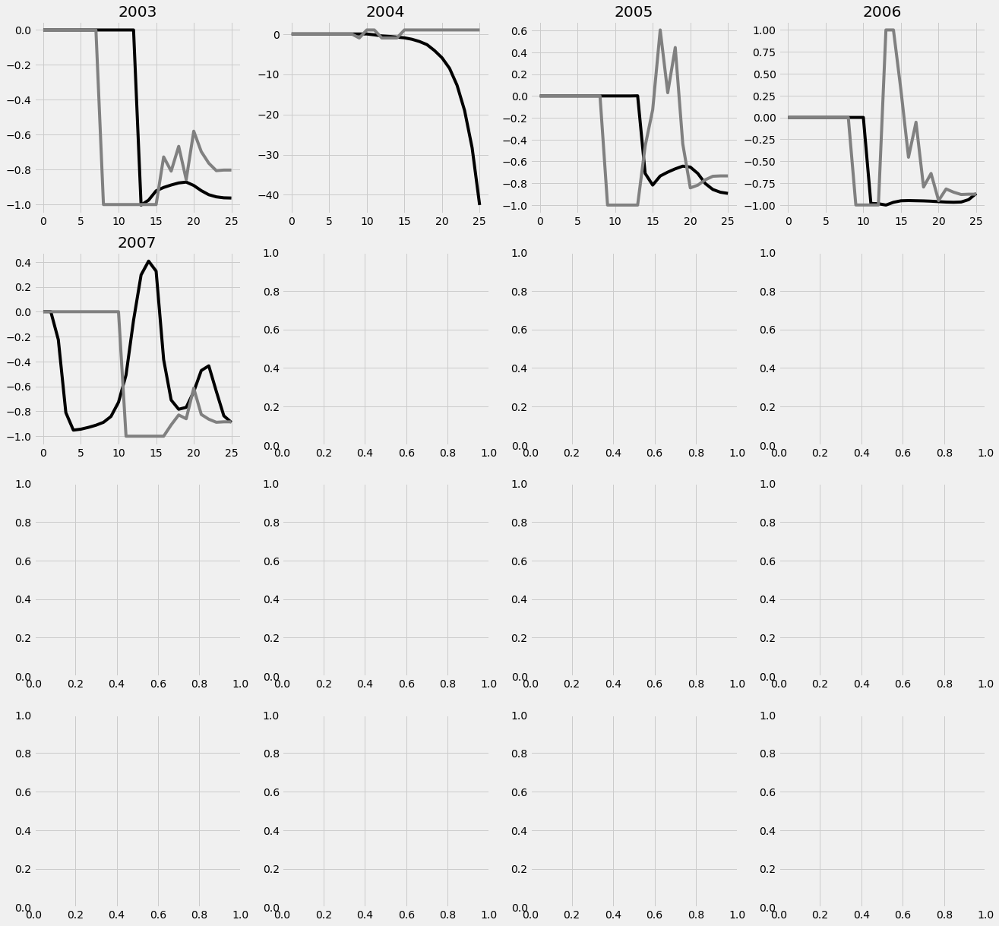

In [59]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale_nan = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
# Y_scale = np.nan_to_num(Y_scale)
Y_scale_nan = np.nan_to_num(Y_scale)

fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
ymax = 0
for j, year in enumerate(analysis_years):
    model = tf.keras.models.Sequential()

    model.add(tf.keras.layers.LSTM(64, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(0.2))

    model.add(tf.keras.layers.Dense(64))
    model.add(tf.keras.layers.Dropout(0.5))

    model.add(tf.keras.layers.LSTM(64, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(0.2))

    model.add(tf.keras.layers.Dense(64))
    model.add(tf.keras.layers.Dropout(0.5))
    
    model.add(tf.keras.layers.LSTM(64, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(0.2))

    model.add(tf.keras.layers.Dense(64))
    model.add(tf.keras.layers.Dropout(0.5))
    
    model.add(tf.keras.layers.LSTM(64, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(0.2))

    model.add(tf.keras.layers.Dense(64))
    model.add(tf.keras.layers.Dropout(0.5))

    model.add(tf.keras.layers.Dense(1))

    model.compile(optimizer='adam', 
                  loss='mae')
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = np.nan_to_num(X_scale_nan[ind])
    train_Y = np.nan_to_num(Y_scale_nan[ind])

    test_X = np.nan_to_num(X_scale_nan[j].reshape(1, X_scale_nan.shape[1], X_scale_nan.shape[2]))
    test_Y = np.nan_to_num(Y_scale_nan[j].reshape(1, Y_scale_nan.shape[1], Y_scale_nan.shape[2]))
    
    history = model.fit(train_X, train_Y, 
                    epochs=2000, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MAE for {year} is {train_mse}')
    print(f'Test MAE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    
#     plot_predictions = scalers_y[j].inverse_transform(convert_zero_to_nan(test_predictions[0]))
#     plot_true = scalers_y[j].inverse_transform(convert_zero_to_nan(test_Y[0]))
    
#     ymax = max(ymax, max(max(plot_predictions), max(plot_true)))
    
#     ax[jx].plot(plot_predictions, color='black')
#     ax[jx].plot(plot_true, color='gray')
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

# for cols in ax:
#     for row in cols:
#         row.set_ylim(0, ymax)

##### MAE - Smaller net

/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:355: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/envs/EEB498/lib/python3.6/site-packages/sklearn/preprocessing/data.py:356: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/opt

Epoch 1/2000
14/14 [==============================] - 98s 7s/sample - loss: 0.4938
Epoch 2/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4764
Epoch 3/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4636
Epoch 4/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4553
Epoch 5/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4406
Epoch 6/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4357
Epoch 7/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4259
Epoch 8/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4256
Epoch 9/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.4139
Epoch 10/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.3935
Epoch 11/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.3848
Epoch 12/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.3840
E

Epoch 99/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2205
Epoch 100/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2367
Epoch 101/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2237
Epoch 102/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2329
Epoch 103/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2286
Epoch 104/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2178
Epoch 105/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2224
Epoch 106/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2079
Epoch 107/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2210
Epoch 108/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2163
Epoch 109/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.2230
Epoch 110/2000
14/14 [==============================] - 0s 2ms/sam

Epoch 196/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1804
Epoch 197/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1821
Epoch 198/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1877
Epoch 199/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1863
Epoch 200/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1860
Epoch 201/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1848
Epoch 202/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1894
Epoch 203/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1913
Epoch 204/2000
14/14 [==============================] - 0s 3ms/sample - loss: 0.1811
Epoch 205/2000
14/14 [==============================] - 0s 4ms/sample - loss: 0.1920
Epoch 206/2000
14/14 [==============================] - 0s 3ms/sample - loss: 0.1819
Epoch 207/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 293/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1690
Epoch 294/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1669
Epoch 295/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1715
Epoch 296/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1647
Epoch 297/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1737
Epoch 298/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1758
Epoch 299/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1664
Epoch 300/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1805
Epoch 301/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1804
Epoch 302/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1806
Epoch 303/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1699
Epoch 304/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 390/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1679
Epoch 391/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1559
Epoch 392/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1609
Epoch 393/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1581
Epoch 394/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1684
Epoch 395/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1525
Epoch 396/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1605
Epoch 397/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1623
Epoch 398/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1596
Epoch 399/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1593
Epoch 400/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1478
Epoch 401/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 487/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1433
Epoch 488/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1497
Epoch 489/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1567
Epoch 490/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1364
Epoch 491/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1524
Epoch 492/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1438
Epoch 493/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1465
Epoch 494/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1508
Epoch 495/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1439
Epoch 496/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1538
Epoch 497/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1551
Epoch 498/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 584/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1369
Epoch 585/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1394
Epoch 586/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1474
Epoch 587/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1377
Epoch 588/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1424
Epoch 589/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1434
Epoch 590/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1443
Epoch 591/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1364
Epoch 592/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1365
Epoch 593/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1376
Epoch 594/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1440
Epoch 595/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 681/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1422
Epoch 682/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1410
Epoch 683/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1338
Epoch 684/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1461
Epoch 685/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1345
Epoch 686/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1425
Epoch 687/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1410
Epoch 688/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1432
Epoch 689/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1367
Epoch 690/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1281
Epoch 691/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1457
Epoch 692/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 778/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1299
Epoch 779/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1322
Epoch 780/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1304
Epoch 781/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1343
Epoch 782/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1306
Epoch 783/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1290
Epoch 784/2000
14/14 [==============================] - 0s 3ms/sample - loss: 0.1264
Epoch 785/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1243
Epoch 786/2000
14/14 [==============================] - 0s 3ms/sample - loss: 0.1365
Epoch 787/2000
14/14 [==============================] - 0s 3ms/sample - loss: 0.1290
Epoch 788/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1370
Epoch 789/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 875/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1267
Epoch 876/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1269
Epoch 877/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1310
Epoch 878/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1348
Epoch 879/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1390
Epoch 880/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1251
Epoch 881/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1266
Epoch 882/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1254
Epoch 883/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1336
Epoch 884/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1291
Epoch 885/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1227
Epoch 886/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 972/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1223
Epoch 973/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1258
Epoch 974/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1198
Epoch 975/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1239
Epoch 976/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1213
Epoch 977/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1222
Epoch 978/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1203
Epoch 979/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1203
Epoch 980/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1238
Epoch 981/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1261
Epoch 982/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1203
Epoch 983/2000
14/14 [==============================] - 0s 2ms/sa

Epoch 1068/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1180
Epoch 1069/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1152
Epoch 1070/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1150
Epoch 1071/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1182
Epoch 1072/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1144
Epoch 1073/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1166
Epoch 1074/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1179
Epoch 1075/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1162
Epoch 1076/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1169
Epoch 1077/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1218
Epoch 1078/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1203
Epoch 1079/2000
14/14 [==============================]

Epoch 1164/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1175
Epoch 1165/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1096
Epoch 1166/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1132
Epoch 1167/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1102
Epoch 1168/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1162
Epoch 1169/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1136
Epoch 1170/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1062
Epoch 1171/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1162
Epoch 1172/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1138
Epoch 1173/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1089
Epoch 1174/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1161
Epoch 1175/2000
14/14 [==============================]

Epoch 1260/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1108
Epoch 1261/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1156
Epoch 1262/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1094
Epoch 1263/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1114
Epoch 1264/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1030
Epoch 1265/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1162
Epoch 1266/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1073
Epoch 1267/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1031
Epoch 1268/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1150
Epoch 1269/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1070
Epoch 1270/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1136
Epoch 1271/2000
14/14 [==============================]

Epoch 1356/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1120
Epoch 1357/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1118
Epoch 1358/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1026
Epoch 1359/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1106
Epoch 1360/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1062
Epoch 1361/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1042
Epoch 1362/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1078
Epoch 1363/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1000
Epoch 1364/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1068
Epoch 1365/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1049
Epoch 1366/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1070
Epoch 1367/2000
14/14 [==============================]

Epoch 1452/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1147
Epoch 1453/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1094
Epoch 1454/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1060
Epoch 1455/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1013
Epoch 1456/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1129
Epoch 1457/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1010
Epoch 1458/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1025
Epoch 1459/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1083
Epoch 1460/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1133
Epoch 1461/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1052
Epoch 1462/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1057
Epoch 1463/2000
14/14 [==============================]

Epoch 1548/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1050
Epoch 1549/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1059
Epoch 1550/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0989
Epoch 1551/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1019
Epoch 1552/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1034
Epoch 1553/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1027
Epoch 1554/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1068
Epoch 1555/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0992
Epoch 1556/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1064
Epoch 1557/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1007
Epoch 1558/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1013
Epoch 1559/2000
14/14 [==============================]

Epoch 1644/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1032
Epoch 1645/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1020
Epoch 1646/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0968
Epoch 1647/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0992
Epoch 1648/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0989
Epoch 1649/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0983
Epoch 1650/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1045
Epoch 1651/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1034
Epoch 1652/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1021
Epoch 1653/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1015
Epoch 1654/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1026
Epoch 1655/2000
14/14 [==============================]

Epoch 1740/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1052
Epoch 1741/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1036
Epoch 1742/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0935
Epoch 1743/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0950
Epoch 1744/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1064
Epoch 1745/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0962
Epoch 1746/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1023
Epoch 1747/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0961
Epoch 1748/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1005
Epoch 1749/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1001
Epoch 1750/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1010
Epoch 1751/2000
14/14 [==============================]

Epoch 1836/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0959
Epoch 1837/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0975
Epoch 1838/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1031
Epoch 1839/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0974
Epoch 1840/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0986
Epoch 1841/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0956
Epoch 1842/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1020
Epoch 1843/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0944
Epoch 1844/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1007
Epoch 1845/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0998
Epoch 1846/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0949
Epoch 1847/2000
14/14 [==============================]

Epoch 1932/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0895
Epoch 1933/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0991
Epoch 1934/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1097
Epoch 1935/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0957
Epoch 1936/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1017
Epoch 1937/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0917
Epoch 1938/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0985
Epoch 1939/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0957
Epoch 1940/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0972
Epoch 1941/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.0998
Epoch 1942/2000
14/14 [==============================] - 0s 2ms/sample - loss: 0.1004
Epoch 1943/2000
14/14 [==============================]

KeyboardInterrupt: 

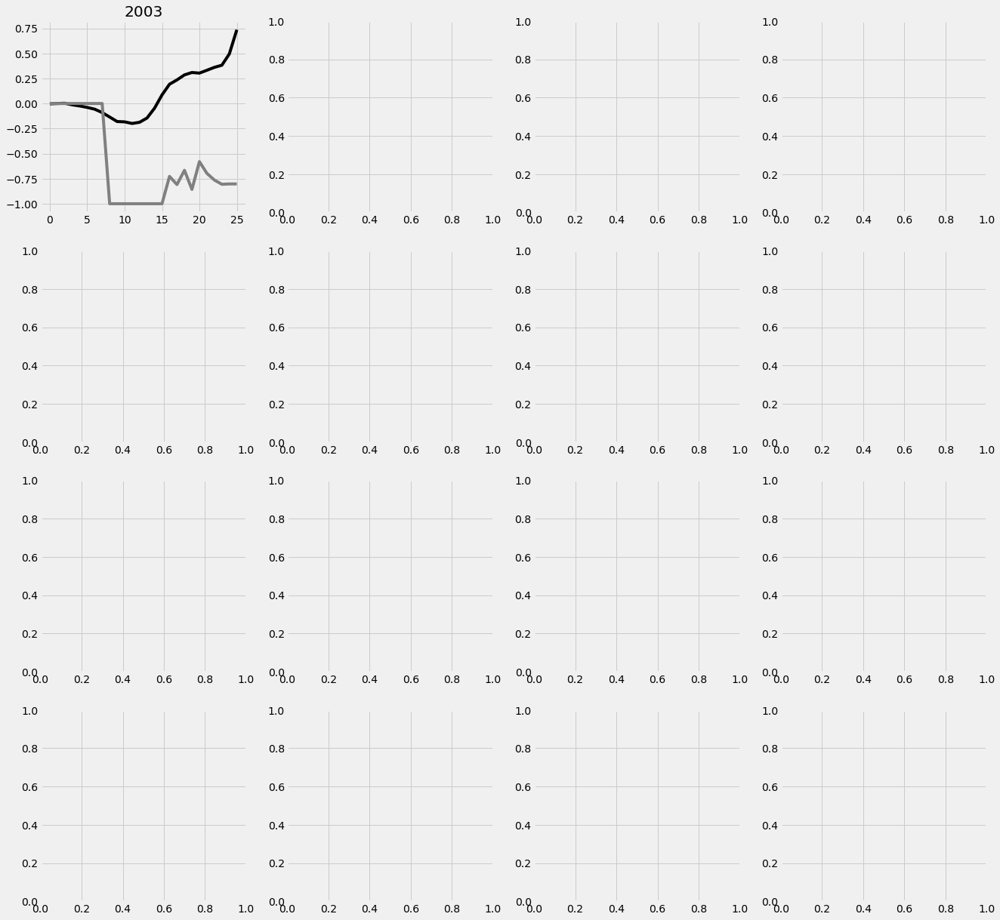

In [204]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale_nan = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
# Y_scale = np.nan_to_num(Y_scale)
Y_scale_nan = np.nan_to_num(Y_scale)

fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
ymax = 0
for j, year in enumerate(analysis_years):
    model = tf.keras.models.Sequential()

    model.add(tf.keras.layers.LSTM(64, input_shape=(26, 5),
                   return_sequences=True,
                   activation='relu'))
    model.add(tf.keras.layers.Dropout(0.2))

    model.add(tf.keras.layers.Dense(64))
    model.add(tf.keras.layers.Dropout(0.5))

    model.add(tf.keras.layers.Dense(1))

    model.compile(optimizer='adam', 
                  loss='mae')
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = np.nan_to_num(X_scale_nan[ind])
    train_Y = np.nan_to_num(Y_scale_nan[ind])

    test_X = np.nan_to_num(X_scale_nan[j].reshape(1, X_scale_nan.shape[1], X_scale_nan.shape[2]))
    test_Y = np.nan_to_num(Y_scale_nan[j].reshape(1, Y_scale_nan.shape[1], Y_scale_nan.shape[2]))
    
    history = model.fit(train_X, train_Y, 
                    epochs=2000, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MAE for {year} is {train_mse}')
    print(f'Test MAE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    
#     plot_predictions = scalers_y[j].inverse_transform(convert_zero_to_nan(test_predictions[0]))
#     plot_true = scalers_y[j].inverse_transform(convert_zero_to_nan(test_Y[0]))
    
#     ymax = max(ymax, max(max(plot_predictions), max(plot_true)))
    
#     ax[jx].plot(plot_predictions, color='black')
#     ax[jx].plot(plot_true, color='gray')
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

# for cols in ax:
#     for row in cols:
#         row.set_ylim(0, ymax)

### Test LSTM years of training data required

### Test LSTM on very incomplete data

Note to self:

in X, each of these indices correspond to these predictors:

0: non-motiles

1: temperature

2: salinity

3: industry counts

#### Remove industry counts on test

Epoch 1/500
14/14 [==============================] - 8s 584ms/sample - loss: 0.6286
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5836
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5462
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4852
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4515
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4132
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3543
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3284
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3041
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2884
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2879
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3043
Epoch 13/50

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1812
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1668
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1780
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1829
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1811
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1746
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1727
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1717
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1697
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1631
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1697
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1431
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1347
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1393
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1547
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1460
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1383
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1448
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1464
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1523
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1521
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1424
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1189
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1228
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1297
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1281
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1139
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1094
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1234
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1217
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1067
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1134
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1143
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0973
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1011
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1061
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1024
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0942
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1080
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1151
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1094
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0927
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1104
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1087
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0846
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0990
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0868
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0981
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0888
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0805
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0814
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0890
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0820
###################
Train MSE for 2003 is 0.054154090410928724
Test MSE for 2003 is 0.19725287604288877
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0718
Epoch 2/500
14/14 [===================

Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0659
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0635
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0616
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0697
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0630
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0670
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0691
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0665
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0630
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0618
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0668
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Ep

Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0555
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0635
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0612
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0497
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0623
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0567
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0608
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0610
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0582
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0546
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0631
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0534
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0540
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0519
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0581
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0610
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0456
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0543
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0530
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0565
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0518
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0477
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0551
Epoch 392/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0479
Epoch 393/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0536
Epoch 394/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0477
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0459
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0512
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0432
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0465
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0440
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0559
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0669
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0710
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0666
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0650
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0676
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0849
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0816
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0660
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0758
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0704
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0662
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0794
Epoch 91/500
14/1

Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0733
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0644
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0624
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0577
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0733
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0683
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0610
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0608
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0626
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0608
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0604
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0614
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0530
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0579
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0606
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0612
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0630
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0541
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0663
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0554
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0439
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0559
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0527
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0549
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0539
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0443
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0453
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0497
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0480
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0459
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0461
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0530
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0617
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0538
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0475
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0400
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoc

Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0426
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0465
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0440
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 470/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0457
Epoch 471/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0345
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0345
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 

Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 48/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoc

Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 147/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 39/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 40/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 41/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 42/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 43/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoc

Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 437/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 28/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 29/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 31/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 32/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 33/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoc

Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 133/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 229/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 231/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0160
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 328/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 425/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 426/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 18/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 19/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoc

Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 217/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0264
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 311/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0287
Epoch 312/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0232
Epoch 313/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0206
Epoch 314/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0268
Epoch 315/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0256
Epoch 316/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0201
Epoch 317/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0205
Epoch 318/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0204
Epoch 319/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0267
Epoch 320/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0208
Epoch 321/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0212
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 409/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0258
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 412/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 413/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 416/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0209
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 6/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0274
Epoch 7/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0210
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 9/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0231
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 14/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0144
Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 18

Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 111/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0194
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 113/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0296
Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 210/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 403/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0208
Epoch 404/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0170
Epoch 405/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0162
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
###################
Train MSE for 2012 is 0.0024141988125399123
Test MSE for 2012 is 0.06233420805253322
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 7/500
14/14 [============================

Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 103/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0257
Epoch 104/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0248
Epoch 105/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0249
Epoch 106/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.02

Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 194/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0216
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0143
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 198/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0209
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 201/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0218
Epoch 202/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0241
Epoch 203/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0192
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0164
Epoch 293/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0173
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0159
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0147
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0165
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 4ms/sample - loss: 0.0162
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 88/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0181
Epoch 89/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0257
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 93/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0254
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 96/500
14/1

Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 191/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0179
Epoch 192/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0212
Epoch 193/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 283/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0180
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 286/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0200
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 480/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0162
Epoch 481/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0163
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 483/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0218
Epoch 484/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0191
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0345
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 85/500
14/1

14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0159
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 

Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoc

Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0160
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 264/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0167
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0160
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0152
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 

Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0149
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0158
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss:

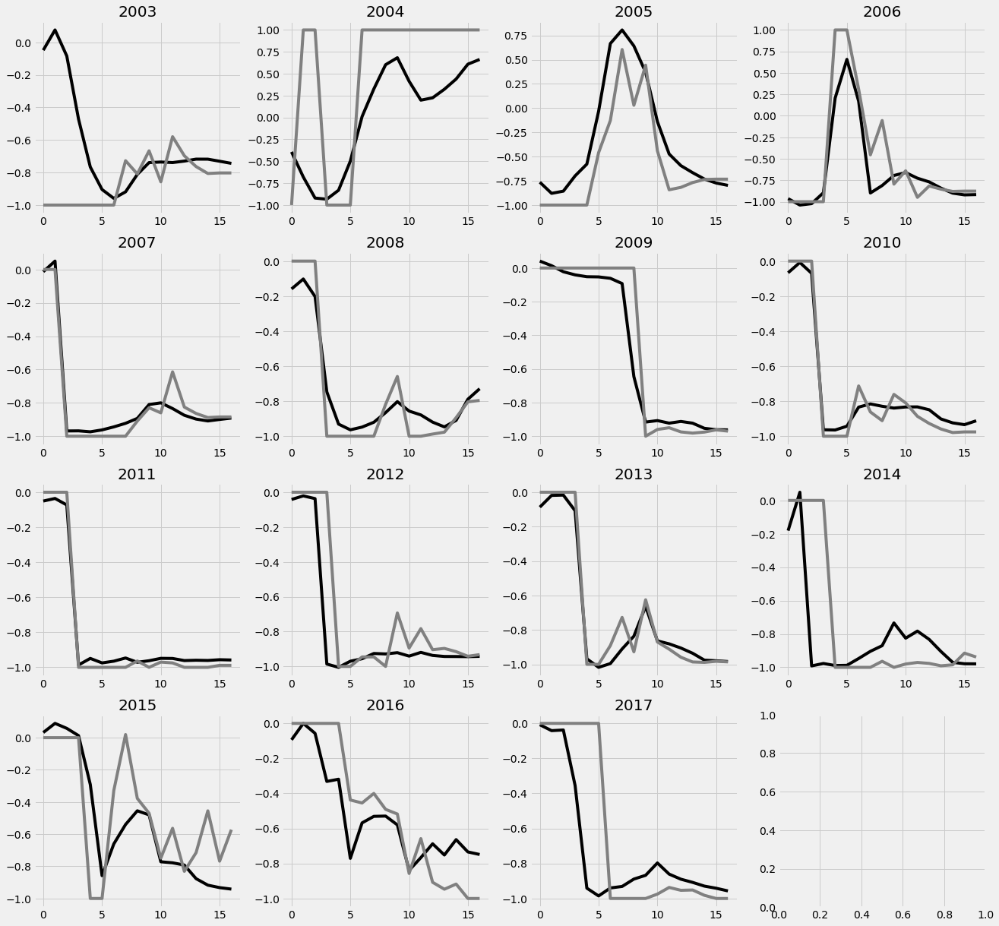

In [277]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]
    
    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_X[0][:, 3] = np.full(17, 0)
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

#### Remove motiles on test

Epoch 1/500
14/14 [==============================] - 8s 592ms/sample - loss: 0.6404
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5852
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5503
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5180
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4490
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4383
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3912
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3476
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3265
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2772
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3010
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3043
Epoch 13/50

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1671
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1706
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1621
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1624
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1696
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1620
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1770
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1809
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1656
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1697
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1670
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1524
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1310
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1542
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1379
Epoch 202/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.1312
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1430
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1444
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1534
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1459
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1444
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1369
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1023
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1101
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1063
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0927
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1092
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1113
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1086
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1107
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1010
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1080
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1013
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0976
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0928
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0945
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0866
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1142
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0944
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0857
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0922
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0875
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0891
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0903
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0822
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0926
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0849
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0892
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0877
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0798
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0718
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0842
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0785
###################
Train MSE for 2003 is 0.04846938179014498
Test MSE for 2003 is 0.5467198371662317
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0994
Epoch 2/500
14/14 [=====================

Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0591
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0599
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0617
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0597
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0519
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0582
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0565
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0566
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0538
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0552
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0593
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0580
Ep

Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0542
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0577
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0514
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0498
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0534
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0499
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0504
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0480
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0471
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0455
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0571
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0509
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0548
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0446
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0456
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0477
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0514
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0431
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0548
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0712
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0743
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0751
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0661
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0854
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0754
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0774
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0782
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0759
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0702
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0864
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0693
Epoch 91/500
14/1

Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0628
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0605
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0632
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0606
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0616
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0618
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0730
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0625
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0578
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0563
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0637
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0508
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0508
Epoch 277/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0635
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0534
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0546
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0544
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0645
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0639
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0589
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0539
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0447
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0632
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0579
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0499
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0514
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0496
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0431
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0440
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0501
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0492
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0454
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0450
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoc

Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0397
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0366
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 366/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0383
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 368/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0344
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 469/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0303
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0400
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 

Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 254/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0291
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 449/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0307
Epoch 450/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0278
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 456/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0303
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 48/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0483
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0395
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0426
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoc

Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 147/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0410
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0397
Epoch 153/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0315
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0418
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 39/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 40/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 41/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 42/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 43/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoc

Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0345
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0345
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 437/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 28/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 29/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 31/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 32/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 33/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoc

Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 133/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 229/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 231/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 328/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 425/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 426/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 18/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 19/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0336
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0380
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoc

Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 217/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 224/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 313/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 314/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 315/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 316/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 317/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 318/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 319/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 412/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0328
Epoch 413/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0273
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 416/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 14/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 17/500
14/14 [=

Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 113/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 210/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 304/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0258
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
###################
Train MSE for 2012 is 0.004874071792845828
Test MSE for 2012 is 0.0487774701538026
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 6/500
14/14 [============================

Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.021

Epoch 192/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0212
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 195/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0250
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 486/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0161
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 494/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0272
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 95/500
14/1

Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 286/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0215
Epoch 287/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0212
Epoch 288/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0192
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0147
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoc

Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0151
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoc

Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0154
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0164
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0160
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 

Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0144
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 449/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0246
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss:

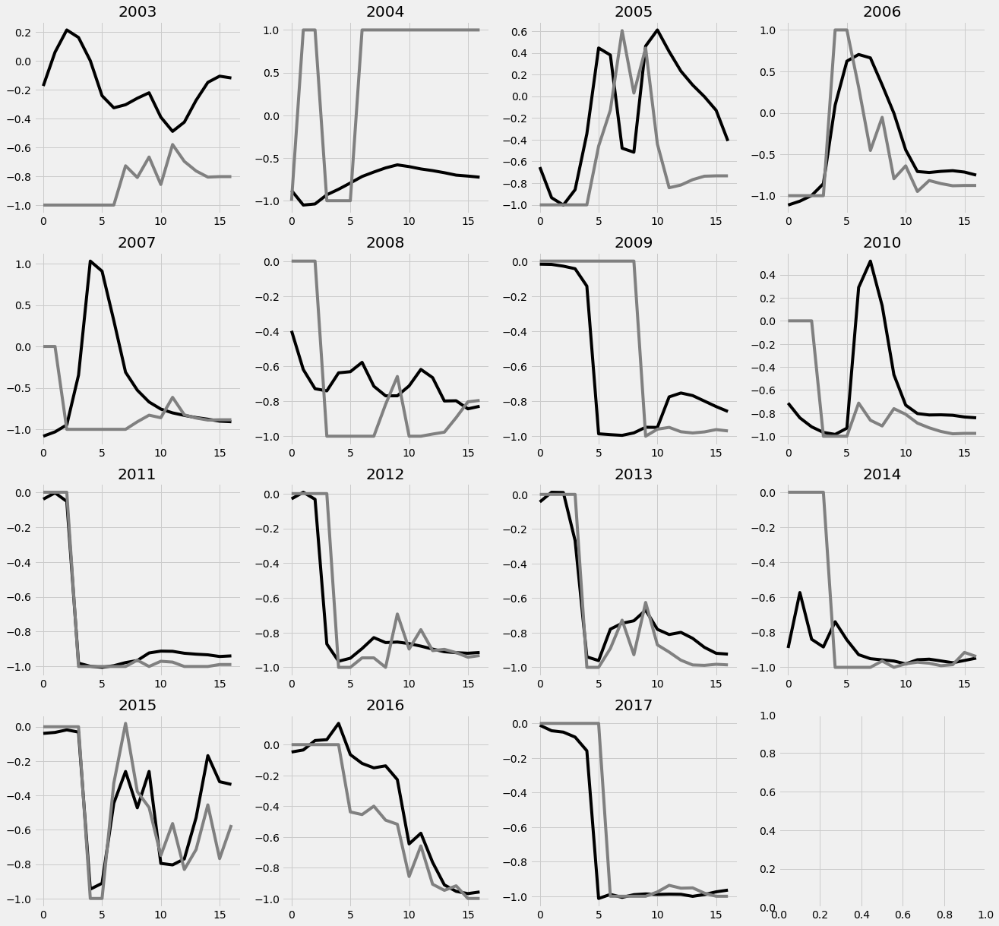

In [278]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]
    
    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_X[0][:, 0] = np.full(17, 0)
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

#### Remove temperature on test

Epoch 1/500
14/14 [==============================] - 9s 633ms/sample - loss: 0.6983
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.6163
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5727
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5383
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4936
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4651
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4189
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3919
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3392
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3254
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3258
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2966
Epoch 13/50

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1786
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1829
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1741
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1711
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1760
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1797
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1849
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1740
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1836
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1868
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1701
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1434
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1572
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1490
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1511
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1495
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1465
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1393
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1542
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1596
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1460
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1498
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1324
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1078
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1219
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1125
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1262
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1300
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1087
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1247
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1134
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1211
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1326
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1028
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1090
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1037
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0916
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1041
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0950
Epoch 400/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0998
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0882
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0987
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0893
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0946
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0843
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0838
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0941
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0940
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0866
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0886
Epoch 498/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0861
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0842
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0875
###################
Train MSE for 2003 is 0.05131474872671732
Test MSE for 2003 is 0.21561907767403443
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0746
Epoch 2/500
14/14 [====================

Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0564
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0578
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0596
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0674
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0595
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0599
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0622
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0599
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0635
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0608
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0634
Epoch 101/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0672
Ep

Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0503
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0503
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0583
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0546
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0544
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0588
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0535
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0588
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0531
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0604
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0636
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0529
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0525
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0515
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0532
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0505
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0488
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0561
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0501
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0502
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0540
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0453
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0498
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0471
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 394/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0509
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0422
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0397
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0443
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0447
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0418
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0708
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0657
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0646
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0710
Epoch 83/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0649
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0712
Epoch 85/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0720
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0687
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0602
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0656
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0754
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0558
Epoch 91/500
14/1

Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0660
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0594
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0680
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0549
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0610
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0573
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0625
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0616
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0629
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0574
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0660
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0622
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0498
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0524
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0553
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0628
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0553
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0496
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0427
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0519
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0461
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0389
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoc

Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0543
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0534
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0506
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0453
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0635
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0470
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0475
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0538
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0447
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0516
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0404
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0439
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 

Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 48/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoc

Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 147/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 39/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 40/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 41/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 42/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 43/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoc

Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 437/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 28/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 29/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 31/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 32/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 33/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 37/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0272
Epoc

Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 133/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 229/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0280
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 231/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 328/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 425/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 426/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 18/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 19/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoc

Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 217/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 313/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 314/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 315/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 316/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 317/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 318/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 319/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 412/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 413/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 416/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 14/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0260
Epoch 15/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0237
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 17/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0210
Epoch 18

Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 113/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 210/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
###################
Train MSE for 2012 is 0.001579102871268095
Test MSE for 2012 is 0.01876127471012354
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 5/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0254
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 7/500
14/14 [=============================

Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.02

Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0158
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0151
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 494/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0160
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 496/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0193
Epoch 497/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0182
Epoch 498/500
14/14 [==============================] - 0s 3ms/sample - loss:

14/14 [==============================] - 0s 4ms/sample - loss: 0.0233
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0158
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 96/500
14/1

Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 184/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0238
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0149
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 189/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0219
Epoch 190/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0179
Epoch 191/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0267
Epoch 192/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0190
Epoch 193/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0153
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0145
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0150
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0156
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoc

Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0160
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0151
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 179/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0161
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0145
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0165
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0160
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0145
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 276/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0190
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0142
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0158
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0139
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0145
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoc

Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 455/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0192
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0144
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0150
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 159/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0171
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 

Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0149
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0142
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0159
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0137
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss:

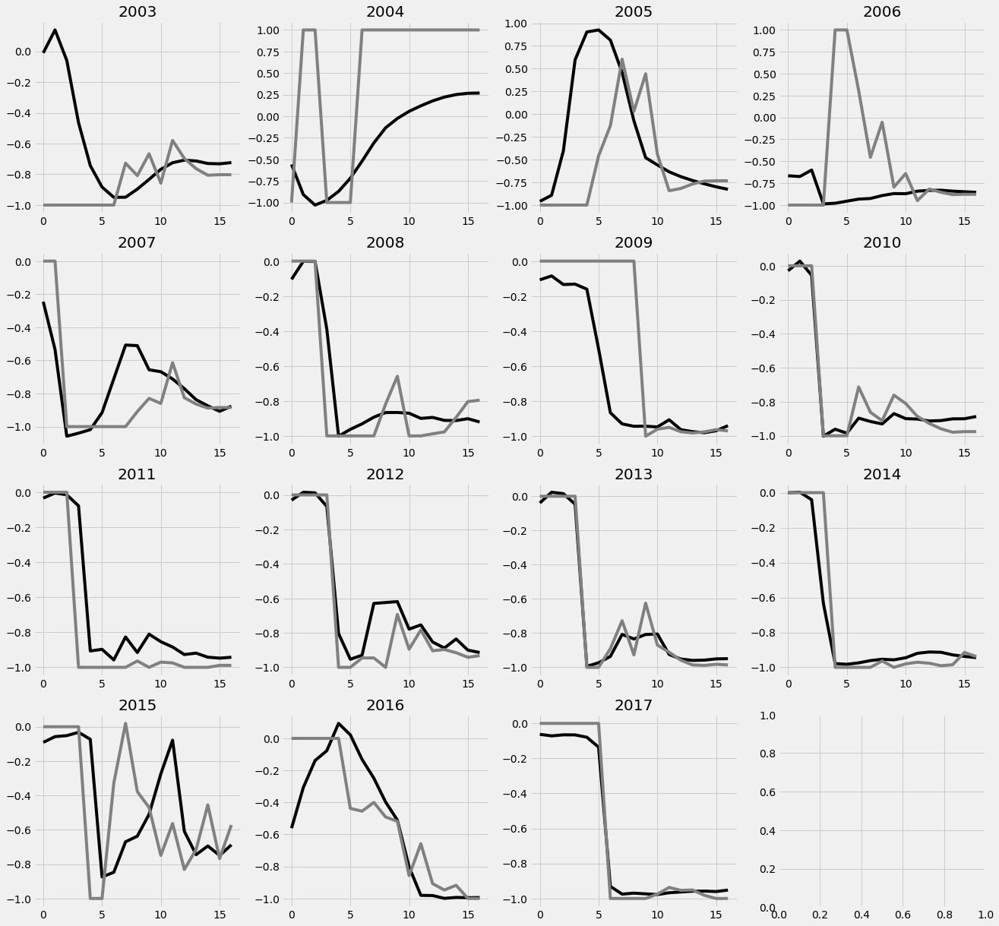

In [279]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]
    
    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_X[0][:, 1] = np.full(17, 0)
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

#### Remove salinity on test

Epoch 1/500
14/14 [==============================] - 10s 681ms/sample - loss: 0.6818
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.6353
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5961
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5463
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5190
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4786
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4480
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4074
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3992
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3404
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3064
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2831
Epoch 13/5

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1738
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1756
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1639
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1798
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1768
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1667
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1648
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1766
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1706
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1886
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1766
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1470
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1379
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1586
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1346
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1538
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1519
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1429
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1351
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1518
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1347
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1399
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1197
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1147
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1228
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1140
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1052
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1097
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1060
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1232
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1199
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1062
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1095
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0946
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1028
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1092
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0951
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0893
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0990
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1086
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0958
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1254
Epoch 403/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0883
Epoch 404/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0911
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0814
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0902
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0827
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0843
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0949
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0871
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0898
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0849
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0873
###################
Train MSE for 2003 is 0.05237123087487512
Test MSE for 2003 is 0.13860084502328573
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0656
Epoch 2/500
14/14 [====================

Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0639
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0652
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0605
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0640
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0692
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0646
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0675
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0558
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0614
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0643
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0590
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0710
Ep

Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0646
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0505
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0594
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0589
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0550
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0564
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0581
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0569
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0560
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0575
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0582
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0536
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0522
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0521
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0533
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0488
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0470
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0522
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0506
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0470
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0489
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0518
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0493
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0566
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0443
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0422
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0459
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0461
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0457
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0483
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0678
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0717
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0642
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0780
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0610
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0645
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0667
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0615
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0532
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0610
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0642
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0644
Epoc

Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0581
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0618
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0578
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0583
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0647
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0603
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0555
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0657
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0594
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0645
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0566
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0641
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0586
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0601
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0518
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0513
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0591
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0568
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0573
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0558
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0588
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0552
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0493
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0633
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0546
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0509
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0521
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0533
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0595
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0504
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0559
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0471
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0577
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0574
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0557
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0473
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0516
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0539
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0519
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0456
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0522
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0483
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0485
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0499
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0443
Epoc

Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0554
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0427
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0535
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0456
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0427
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0431
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0404
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0440
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 369/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0374
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0392
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0432
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0451
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0417
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0424
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0410
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 

Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0532
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 358/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0400
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0395
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0380
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0392
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 48/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 146/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0308
Epoch 147/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0344
Epoch 148/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0329
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 

Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0418
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 39/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 40/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 41/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 42/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 43/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoc

Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 437/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 28/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 29/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 31/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 32/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0547
Epoch 33/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0439
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0418
Epoc

Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 133/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 229/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 231/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 328/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0311
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 425/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 426/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 18/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 19/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoc

Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 217/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 313/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 314/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 315/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 316/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 317/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 318/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 319/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 412/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 413/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 416/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 14/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 17/500
14/14 [=

Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 113/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 210/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 398/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0216
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 403/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0296
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
###################
Train MSE for 2012 is 0.0046649751242221335
Test MSE for 2012 is 0.023225130855743157
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 6/500
14/14 [=========================

Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.030

Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 391/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0224
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 95/500
14/1

Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0156
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0159
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoc

Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 374/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0172
Epoch 375/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0251
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 469/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0224
Epoch 470/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0211
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 473/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0191
Epoch 474/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0189
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoc

Epoch 159/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0224
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 170/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 355/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0312
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0161
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 

Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0150
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0139
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 255/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0196
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0148
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 344/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0202
Epoch 345/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0158
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 347/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0189
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 349/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0219
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0143
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss:

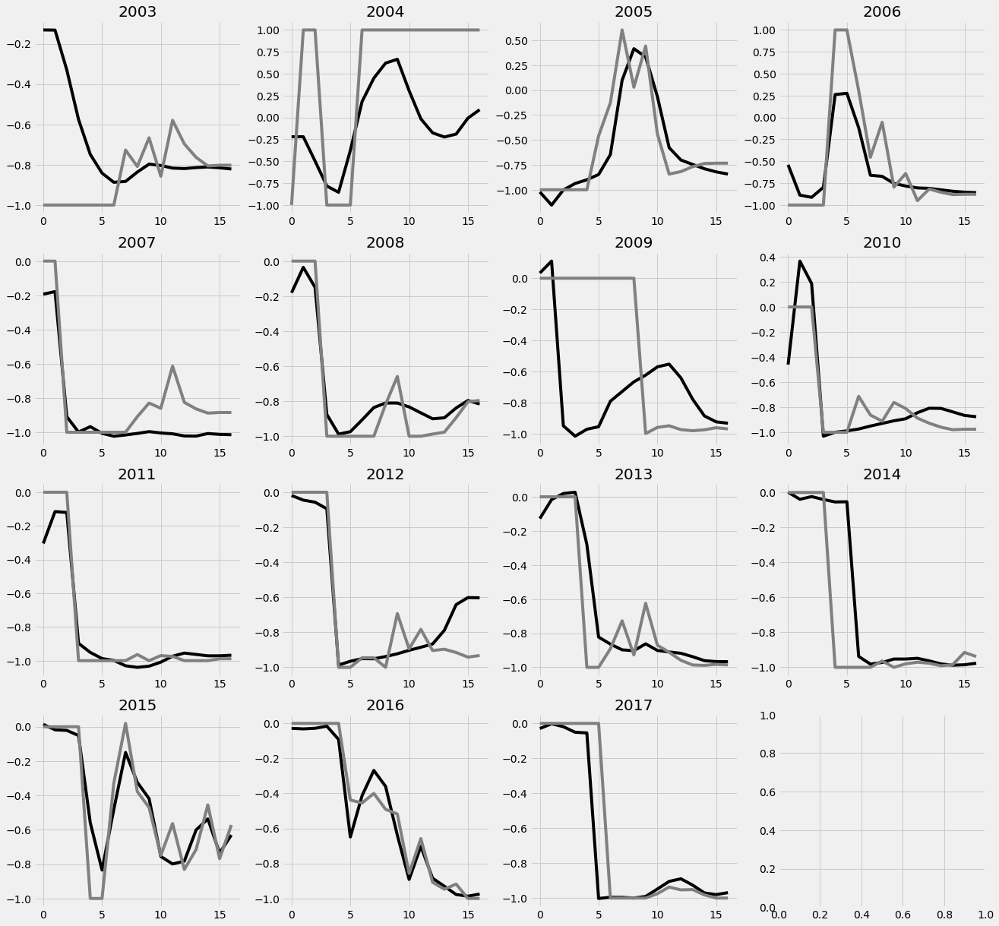

In [280]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]
    
    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_X[0][:, 2] = np.full(17, 0)
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

#### Remove all but temperature on test

Epoch 1/500
14/14 [==============================] - 10s 697ms/sample - loss: 0.6261
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5962
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5650
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5323
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4770
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4476
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4130
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3713
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3407
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3011
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3154
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3014
Epoch 13/5

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1747
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1559
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1708
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1705
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1824
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1696
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1656
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1632
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1785
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1713
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1651
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1511
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1384
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1605
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1347
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1383
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1459
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1476
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1417
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1439
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1407
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1469
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1272
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1099
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1110
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1111
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1030
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1074
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1144
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1282
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1197
Epoch 305/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.1147
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1052
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0979
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0962
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1053
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0969
Epoch 398/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0952
Epoch 399/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.1007
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0993
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0968
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0901
Epoch 403/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.1019
Epoch 404/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.1125
Epoch 405/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0843
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0810
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0804
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0808
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0829
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1058
Epoch 498/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0770
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0857
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1009
###################
Train MSE for 2003 is 0.05726122070782169
Test MSE for 2003 is 0.2731588487852936
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0851
Epoch 2/500
14/14 [=====================

Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0640
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0643
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0585
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0602
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0659
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0643
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0558
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0582
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0584
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0616
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0525
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0575
Ep

Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0523
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0532
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0451
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0598
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0564
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0573
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0544
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0485
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0541
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0521
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0477
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0443
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0523
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0443
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0513
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0502
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0719
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0751
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0717
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0729
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0768
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0734
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0841
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0794
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0786
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0749
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0786
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0847
Epoch 91/500
14/1

Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0713
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0729
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0663
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0720
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0682
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0754
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0767
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0747
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0650
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0796
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0683
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0661
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0733
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0681
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0664
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0636
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0703
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0705
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0676
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0693
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0708
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0608
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0645
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0644
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0668
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0653
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0823
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0699
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0654
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0659
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0721
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0691
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0702
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0569
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0648
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0606
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0596
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0589
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0677
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0626
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0637
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0647
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0616
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0646
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0575
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0641
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0698
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0629
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0686
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0614
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0603
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0628
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0575
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0647
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0620
Epoc

Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0619
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0592
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0599
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0584
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0592
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0625
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0554
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0620
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0532
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0585
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0643
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0599
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0650
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0557
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0703
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0514
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0586
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0705
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0608
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0638
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0525
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0574
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0589
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0581
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0559
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0544
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0566
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0551
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0543
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0547
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0515
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0590
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0548
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0527
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0589
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0529
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0550
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0524
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0620
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0541
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 469/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0587
Epoch 470/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0531
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0553
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0568
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0592
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0577
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0555
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0543
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0629
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0610
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0554
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0619
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0578
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0551
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0506
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0615
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0599
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0497
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0505
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0580
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0621
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0586
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0509
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0523
Epoch 

Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0560
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0539
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0522
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0553
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0467
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0503
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0534
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0506
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0529
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0530
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0521
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0509
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0492
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0554
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0505
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0488
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0506
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0465
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0561
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0528
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0503
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0505
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0550
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0611
Epoch 48/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0534
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0529
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0639
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0653
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0519
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0645
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0454
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0636
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0535
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0588
Epoc

Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0473
Epoch 147/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0554
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0443
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0504
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0417
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0523
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0470
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0623
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0546
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0576
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0483
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0470
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0512
Epoch 347/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0412
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0424
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0525
Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0531
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0524
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0516
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0624
Epoch 39/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 40/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0504
Epoch 41/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 42/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0534
Epoch 43/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0535
Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoc

Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0474
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0459
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0451
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0465
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0400
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0591
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0424
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0480
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0471
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0512
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0502
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0487
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0552
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 437/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0549
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0515
Epoch 28/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0446
Epoch 29/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0521
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 31/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 32/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0613
Epoch 33/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0477
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0513
Epoc

Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 133/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0397
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 229/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 231/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0526
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 328/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 425/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0276
Epoch 426/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0395
Epoch 17/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0383
Epoch 18/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0429
Epoch 19/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0392
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoc

Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 217/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 313/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 314/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 315/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 316/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 317/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 318/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 319/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 412/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 413/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 416/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 14/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 18

Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 113/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0389
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 210/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0269
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
###################
Train MSE for 2012 is 0.007028127802571795
Test MSE for 2012 is 0.09173165229721034
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0459
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0366
Epoch 7/500
14/14 [=============================

Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.03

Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 296/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0364
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 497/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0308
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0431
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0476
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0456
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 96/500
14/1

Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0501
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0574
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0508
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0457
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 287/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0334
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0389
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0397
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 477/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0495
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0380
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0483
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 85/500
14/1

14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 

Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0474
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0366
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 375/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0327
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0380
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0455
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0404
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoc

Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0476
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0392
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 360/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0302
Epoch 361/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0332
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0533
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0471
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0447
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0457
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0426
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 

Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 355/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0326
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss:

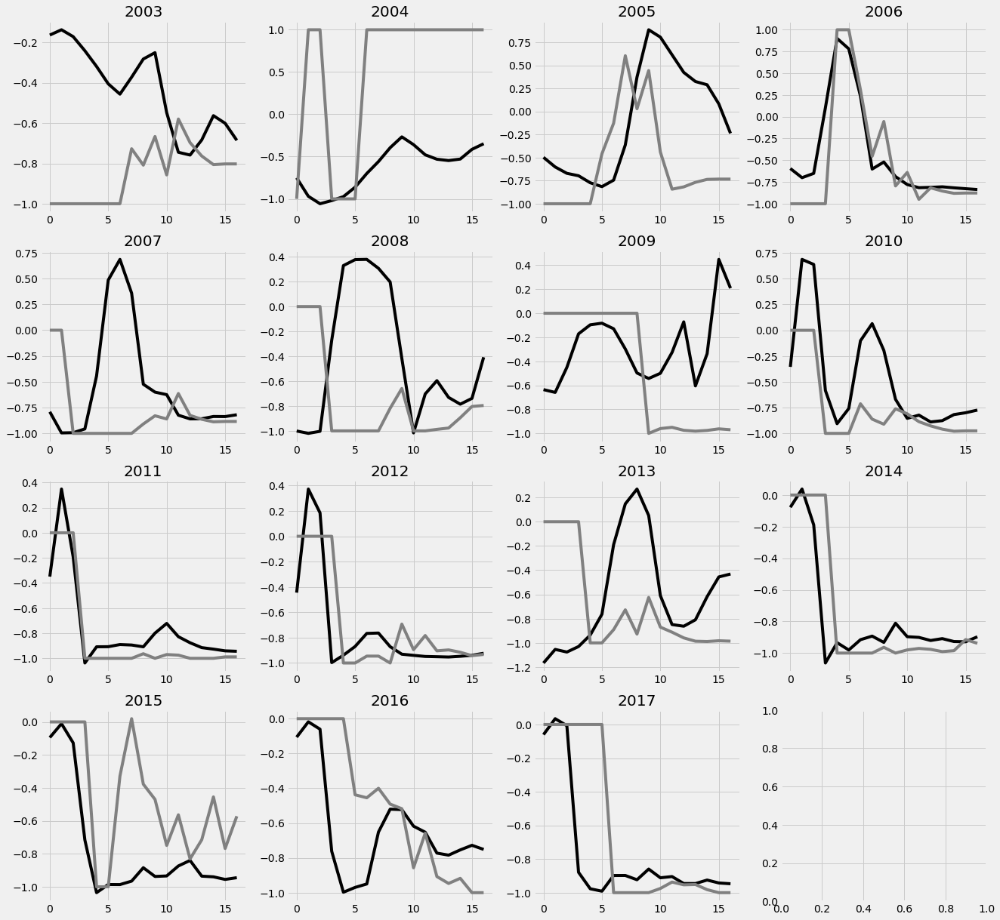

In [281]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]
    
    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_X[0][:, 0] = np.full(17, 0)
    test_X[0][:, 2] = np.full(17, 0)
    test_X[0][:, 3] = np.full(17, 0)
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

#### Only temperature and only the first two months of temperature data

Epoch 1/500
14/14 [==============================] - 10s 746ms/sample - loss: 0.6624
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.6191
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5857
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5601
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5302
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5049
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4584
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4158
Epoch 9/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.3880
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3718
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3358
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2947
Epoch 13/5

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1679
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1784
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1759
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1847
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1807
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1760
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1781
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1615
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1645
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1736
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1674
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1415
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1462
Epoch 200/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.1461
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1535
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1478
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1565
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1460
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1566
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1561
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1581
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1467
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1255
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1178
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1241
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1331
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1328
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1190
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1221
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1279
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1166
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1297
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1110
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0957
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1092
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1047
Epoch 397/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.1052
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1024
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1044
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1047
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0877
Epoch 402/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.1017
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1031
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1033
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0953
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0872
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0893
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0862
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0886
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0841
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0913
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0887
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0936
###################
Train MSE for 2003 is 0.052147317062014746
Test MSE for 2003 is 0.24699039985697085
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0721
Epoch 2/500
14/14 [===================

Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0569
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0594
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0562
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0616
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0705
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0675
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0619
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0722
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0526
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0699
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0628
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0620
Ep

Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0563
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0563
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0668
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0593
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0499
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0612
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0600
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0594
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0505
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0508
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0508
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0609
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0519
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0492
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0499
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0440
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0456
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0456
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0410
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 491/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0497
Epoch 492/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0460
Epoch 493/500
14/14 [==============================] - 0s 3ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0817
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0738
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0753
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0855
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0828
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0765
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0815
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0737
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0692
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0762
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0770
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0824
Epoch 91/500
14/1

Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0765
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0744
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0707
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0738
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0731
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0757
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0746
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0742
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0689
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0720
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0726
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0709
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0748
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0648
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0670
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0655
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0636
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0716
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0661
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0678
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0759
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0872
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0639
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0551
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0672
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0612
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0529
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0591
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0564
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0549
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0543
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0573
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0553
Epoch 472/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0555
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0515
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0523
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0568
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0564
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0439
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0585
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0488
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0580
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0543
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0628
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0601
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0571
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0577
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0647
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0597
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0523
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0597
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0531
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0573
Epoc

Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0639
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0528
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0533
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0588
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0450
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0485
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0580
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0530
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0516
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0476
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0582
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0563
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0559
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0542
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0454
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0550
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0521
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0454
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0497
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0535
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0518
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0524
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0485
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0461
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0480
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0526
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0478
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0485
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0465
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0536
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0446
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0477
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0446
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0527
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0440
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0450
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0432
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 

Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0530
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0427
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0504
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0539
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0483
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0520
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0417
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0533
Epoch 48/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0487
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0492
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0600
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0485
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0439
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0467
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0520
Epoc

Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0484
Epoch 147/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0508
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0507
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0400
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 249/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0386
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 253/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0380
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0422
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0475
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0431
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0521
Epoch 442/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0447
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0418
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0485
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0392
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0636
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0525
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 39/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0564
Epoch 40/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0467
Epoch 41/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0516
Epoch 42/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0494
Epoch 43/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0504
Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0492
Epoc

Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0500
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0436
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0487
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0600
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0546
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0427
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0536
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0513
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0431
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0508
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0526
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0560
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0490
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0366
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0409
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 437/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0426
Epoch 28/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 29/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 31/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 32/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 33/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0461
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0471
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0479
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0446
Epoc

Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 133/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0407
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0424
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 229/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 231/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0383
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0389
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 328/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0480
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0345
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 425/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 426/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0366
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0542
Epoch 18/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 19/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0419
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0412
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0446
Epoc

Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0386
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0401
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 217/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 313/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 314/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0432
Epoch 315/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 316/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 317/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 318/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 319/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0389
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 412/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0355
Epoch 413/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 416/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0430
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0475
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 14/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 17/500
14/14 [=

Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0345
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 113/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 114/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0295
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 210/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0380
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0363
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
###################
Train MSE for 2012 is 0.010915663627125193
Test MSE for 2012 is 0.0843573368609262
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0371
Epoch 6/500
14/14 [============================

Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0376
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0400
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.034

Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0318
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0291
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0341
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0554
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0361
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0420
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0422
Epoch 95/500
14/1

Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0388
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0347
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0317
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0322
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0404
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 480/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 84/500
14/1

14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0357
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0387
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0381
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0320
Epoch 

Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0417
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0328
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0319
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0450
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0439
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 465/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 466/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 467/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0346
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0290
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0366
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 474/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0499
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0496
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0491
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0482
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0352
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0476
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0453
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0506
Epoc

Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0370
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0350
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0433
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0438
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0496
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0411
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0390
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0397
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0372
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0469
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0498
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0617
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0455
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0465
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0448
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0600
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0392
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0418
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0472
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0396
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0427
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 

Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0360
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0358
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0416
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0395
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0333
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0332
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0399
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0393
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0380
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0410
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0309
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0335
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0354
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0327
Epoch 448/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0344
Epoch 449/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0375
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0405
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0304
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss:

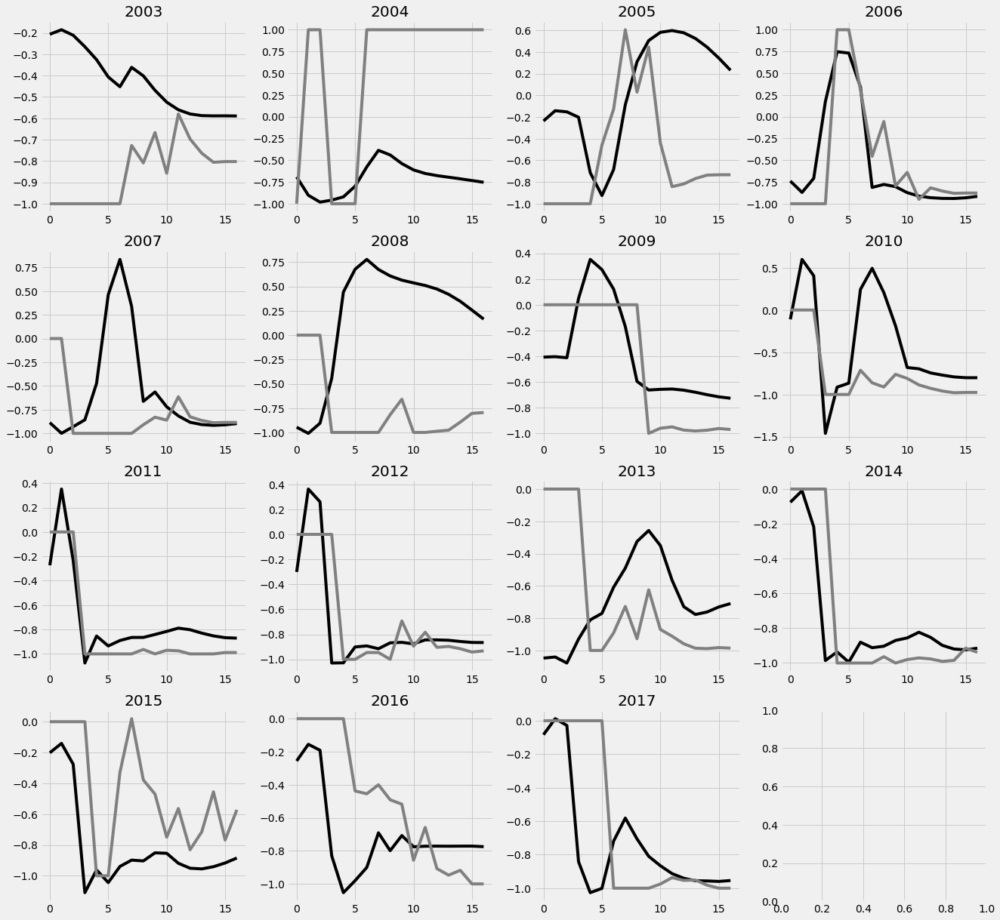

In [282]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]
    
    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_X[0][:, 0] = np.full(17, 0)
    test_X[0][:, 2] = np.full(17, 0)
    test_X[0][:, 3] = np.full(17, 0)
    test_X[0][8:, 1] = np.full(9, 0)
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

#### First two months of all data

Epoch 1/500
14/14 [==============================] - 11s 778ms/sample - loss: 0.6090
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5829
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5408
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.5022
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4524
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.4370
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3931
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3386
Epoch 9/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3052
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2942
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.2735
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.3112
Epoch 13/5

Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1617
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1652
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1725
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1868
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1707
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1684
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1777
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1766
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1614
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1675
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1648
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1297
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1379
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1376
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1457
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1358
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1455
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1451
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1424
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1467
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1414
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1486
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1265
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1147
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1119
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1208
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1176
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1192
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1036
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1291
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1118
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1126
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1108
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0949
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1051
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0897
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1074
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0846
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1057
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1033
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0924
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0986
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.1024
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0904
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0851
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0953
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0993
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0957
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0804
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0864
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0884
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0843
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0898
###################
Train MSE for 2003 is 0.053223670697795634
Test MSE for 2003 is 0.2236751954385302
###################
Epoch 1/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0683
Epoch 2/500
14/14 [====================

Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0607
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0856
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0618
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0682
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0632
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0596
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0664
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0633
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0587
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0581
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0601
Epoch 101/500
14/14 [==============================] - 0s 1ms/sample - loss: 0.0632
Ep

Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0536
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0501
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0572
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0548
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0537
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0535
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0609
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0546
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0556
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0580
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0505
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0466
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0523
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0464
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0495
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0460
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0462
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0441
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0439
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0426
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0529
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0442
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0458
Epoch 386/500
14/14 [==============================] - 0s 4ms/sample - loss: 0.0440
Epoch 387/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0434
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0366
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0428
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 391/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0544
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0437
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0415
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0486
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 482/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0449
Epoch 484/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0463
Epoch 485/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0465
Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0450
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0468
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0402
Epoch 489/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0309
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0378
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0444
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0406
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0698
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0687
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0623
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0699
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0675
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0699
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0689
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0661
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0580
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0642
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0609
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0742
Epoch 91/500
14/1

Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0550
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0657
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0558
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0520
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0555
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0577
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0617
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0586
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0566
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0574
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0488
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0481
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0545
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0471
Epoch 279/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0564
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0548
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0595
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0516
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0496
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0547
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0479
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0529
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0510
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0515
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0408
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0487
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0427
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0519
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0532
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0533
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0461
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0517
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 471/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0442
Epoch 472/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0460
Epoch 473/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0476
Epoch 474/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0435
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0511
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0452
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0429
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0385
Epoch 480/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0416
Epoch 481/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0463
Epoch 482/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0435
Epoch 69/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0372
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0369
Epoch 72/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0320
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 74/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0417
Epoch 75/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0424
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0470
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 78/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0356
Epoch 79/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0387
Epoc

Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0374
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0351
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0316
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0425
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0342
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0398
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0344
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0434
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0470
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0379
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0474
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0382
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0413
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0367
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0326
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0403
Epoch 364/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0344
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0365
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0310
Epoch 369/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0365
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0331
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0323
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0292
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0308
Epoch 463/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0418
Epoch 464/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0317
Epoch 465/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0263
Epoch 466/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0325
Epoch 467/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0303
Epoch 468/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0347
Epoch 469/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0289
Epoch 470/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0337
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0359
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0394
Epoch 59/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0324
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0421
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 63/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0317
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0445
Epoch 65/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0338
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0298
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0414
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0348
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0340
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0356
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0339
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0400
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0377
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 

Epoch 253/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0274
Epoch 254/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0352
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0373
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0343
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0391
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0389
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0375
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0312
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0329
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0353
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0289
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0364
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0334
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0274
Epoch 48/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0338
Epoch 49/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0311
Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0305
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0362
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoc

Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 147/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 148/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0314
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0296
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0293
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0384
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0325
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 245/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0301
Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0294
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0263
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0349
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 343/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 439/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0254
Epoch 440/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0242
Epoch 441/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0259
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0315
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 38/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 39/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 40/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 41/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 42/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0423
Epoch 43/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 44/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 45/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 46/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 47/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0252
Epoc

Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 137/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 138/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0324
Epoch 139/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0368
Epoch 140/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 141/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 142/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 143/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 144/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 145/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 146/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 235/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 236/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 237/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 238/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0307
Epoch 239/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0302
Epoch 240/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0229
Epoch 241/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 242/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 243/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 244/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 333/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0313
Epoch 334/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 335/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 336/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 337/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 338/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0330
Epoch 339/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 340/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 341/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 342/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 429/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0211
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 431/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 432/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 433/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 434/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 435/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 436/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 437/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 438/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0306
Epoch 439/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0227
Epoch 440/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 28/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 29/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0300
Epoch 30/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 31/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0266
Epoch 32/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 33/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 34/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 35/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0287
Epoch 36/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 37/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoc

Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0278
Epoch 127/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 128/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 129/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 130/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 131/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 132/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 133/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0254
Epoch 134/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 135/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 136/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 225/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 226/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 227/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 228/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 229/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 230/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 231/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 232/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 233/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 234/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 323/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 324/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0265
Epoch 325/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 326/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 327/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 328/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 329/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 330/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 331/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 332/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 421/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 422/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 423/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 424/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 425/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 426/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 427/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0275
Epoch 428/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 429/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 430/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 17/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 18/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 19/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 20/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 21/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 22/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 23/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 24/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 25/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0271
Epoch 26/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 27/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoc

Epoch 115/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0233
Epoch 116/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0164
Epoch 117/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 118/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 119/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 120/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 121/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 122/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 123/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 124/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 125/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 126/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 214/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0242
Epoch 215/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 216/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 217/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 218/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 219/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 220/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 221/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 222/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 223/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 224/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 312/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 313/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 314/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 315/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 316/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 317/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0247
Epoch 318/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 319/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 320/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 321/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 322/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0283
Epoch 410/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 411/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 412/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 413/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 414/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 415/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 416/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 417/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 418/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 419/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 420/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 6/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0336
Epoch 7/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0163
Epoch 8/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 9/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0194
Epoch 10/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0282
Epoch 11/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 12/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 13/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 14/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 15/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 16/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 17/500
14/14 [=

Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 106/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 107/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 108/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 109/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 110/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0260
Epoch 111/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0286
Epoch 112/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 113/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 114/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0230
Epoch 115/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 204/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0297
Epoch 205/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 206/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 207/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 208/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0281
Epoch 209/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 210/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 211/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 212/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 213/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 302/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 303/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 304/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 305/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 306/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 307/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 308/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0261
Epoch 309/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 310/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0303
Epoch 311/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 400/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 401/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 402/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 403/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 404/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 405/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 406/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 407/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 408/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 409/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 498/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0285
Epoch 499/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 500/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
###################
Train MSE for 2012 is 0.0029124299854801465
Test MSE for 2012 is 0.003589242093678526
###################
Epoch 1/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 2/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 3/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 4/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 5/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0253
Epoch 6/500
14/14 [=========================

Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 95/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 96/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 97/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0321
Epoch 98/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 99/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0239
Epoch 100/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 101/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0220
Epoch 102/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 103/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0238
Epoch 104/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 105/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.018

Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 193/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0236
Epoch 194/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0250
Epoch 195/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0196
Epoch 196/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 197/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 198/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 199/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0272
Epoch 200/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 201/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0276
Epoch 202/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 203/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0254
Epoch 291/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0268
Epoch 292/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 293/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 294/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0231
Epoch 295/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 296/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 297/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 298/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 299/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0264
Epoch 300/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0257
Epoch 301/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 389/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 390/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 391/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 392/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 393/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0175
Epoch 394/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 395/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0191
Epoch 396/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 397/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 398/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0215
Epoch 399/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 486/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 487/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 488/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 489/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 490/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 491/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 492/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0189
Epoch 493/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 494/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 495/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 496/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 497/500
14/14 [==============================] - 0s 2ms/sample - loss:

14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 84/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0206
Epoch 85/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 86/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 87/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 88/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 89/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 90/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 91/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 92/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 93/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0197
Epoch 94/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0251
Epoch 95/500
14/1

Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 182/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 183/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 184/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 185/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 186/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 187/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 188/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0165
Epoch 189/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 190/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 191/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 192/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 280/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 281/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0270
Epoch 282/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0237
Epoch 283/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0240
Epoch 284/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0164
Epoch 285/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 286/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 287/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0165
Epoch 288/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 289/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 290/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 378/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0187
Epoch 379/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 380/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 381/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 382/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 383/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 384/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0230
Epoch 385/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 386/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 387/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 388/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 476/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 477/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 478/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0166
Epoch 479/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0284
Epoch 480/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0262
Epoch 481/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 482/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0158
Epoch 483/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 484/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0204
Epoch 485/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0178
Epoch 486/500
14/14 [==============================] - 0s 3ms/sample - loss:

Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 73/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 74/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 75/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 76/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 77/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 78/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 79/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0170
Epoch 80/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 81/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 82/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 83/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoc

Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 171/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 172/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 173/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0226
Epoch 174/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 175/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 176/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 177/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 178/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0299
Epoch 179/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0234
Epoch 180/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 181/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 269/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 270/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0143
Epoch 271/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 272/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 273/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0267
Epoch 274/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 275/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0277
Epoch 276/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 277/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0167
Epoch 278/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoch 279/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 367/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 368/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0185
Epoch 369/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 370/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 371/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0171
Epoch 372/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0280
Epoch 373/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0176
Epoch 374/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 375/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0145
Epoch 376/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0255
Epoch 377/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0203
Epoch 465/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0183
Epoch 466/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0205
Epoch 467/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0180
Epoch 468/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0279
Epoch 469/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 470/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0146
Epoch 471/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0190
Epoch 472/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0155
Epoch 473/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0172
Epoch 474/500
14/14 [==============================] - 0s 3ms/sample - loss: 0.0184
Epoch 475/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 62/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 63/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 64/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 65/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0244
Epoch 66/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0219
Epoch 67/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 68/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 69/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 70/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0204
Epoch 71/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 72/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0164
Epoc

Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0248
Epoch 160/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 161/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 162/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0216
Epoch 163/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0256
Epoch 164/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0211
Epoch 165/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 166/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 167/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0181
Epoch 168/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 169/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0208
Epoch 170/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 258/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 259/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0152
Epoch 260/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0193
Epoch 261/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0186
Epoch 262/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0157
Epoch 263/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 264/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0245
Epoch 265/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 266/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0288
Epoch 267/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 268/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 356/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0168
Epoch 357/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 358/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 359/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 360/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0273
Epoch 361/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0217
Epoch 362/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 363/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0182
Epoch 364/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0184
Epoch 365/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 366/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0228
Epoch 454/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0205
Epoch 455/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 456/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0179
Epoch 457/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 458/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0202
Epoch 459/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0258
Epoch 460/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0174
Epoch 461/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0199
Epoch 462/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 463/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0249
Epoch 464/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 50/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 51/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 52/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 53/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 54/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0241
Epoch 55/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 56/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 57/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0172
Epoch 58/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 59/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0232
Epoch 60/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0210
Epoch 61/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0235
Epoc

14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 149/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0180
Epoch 150/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0212
Epoch 151/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 152/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0149
Epoch 153/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0243
Epoch 154/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 155/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0183
Epoch 156/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 157/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 158/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0160
Epoch 159/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 

Epoch 246/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 247/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 248/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0214
Epoch 249/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0209
Epoch 250/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0222
Epoch 251/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 252/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0169
Epoch 253/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0145
Epoch 254/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0177
Epoch 255/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 256/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0218
Epoch 257/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 344/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0200
Epoch 345/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 346/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 347/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0178
Epoch 348/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0198
Epoch 349/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0194
Epoch 350/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0262
Epoch 351/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 352/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0195
Epoch 353/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 354/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0246
Epoch 355/500
14/14 [==============================] - 0s 2ms/sample - loss:

Epoch 442/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0224
Epoch 443/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0188
Epoch 444/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0201
Epoch 445/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0223
Epoch 446/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0192
Epoch 447/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0225
Epoch 448/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0162
Epoch 449/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0221
Epoch 450/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0207
Epoch 451/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0213
Epoch 452/500
14/14 [==============================] - 0s 2ms/sample - loss: 0.0173
Epoch 453/500
14/14 [==============================] - 0s 2ms/sample - loss:

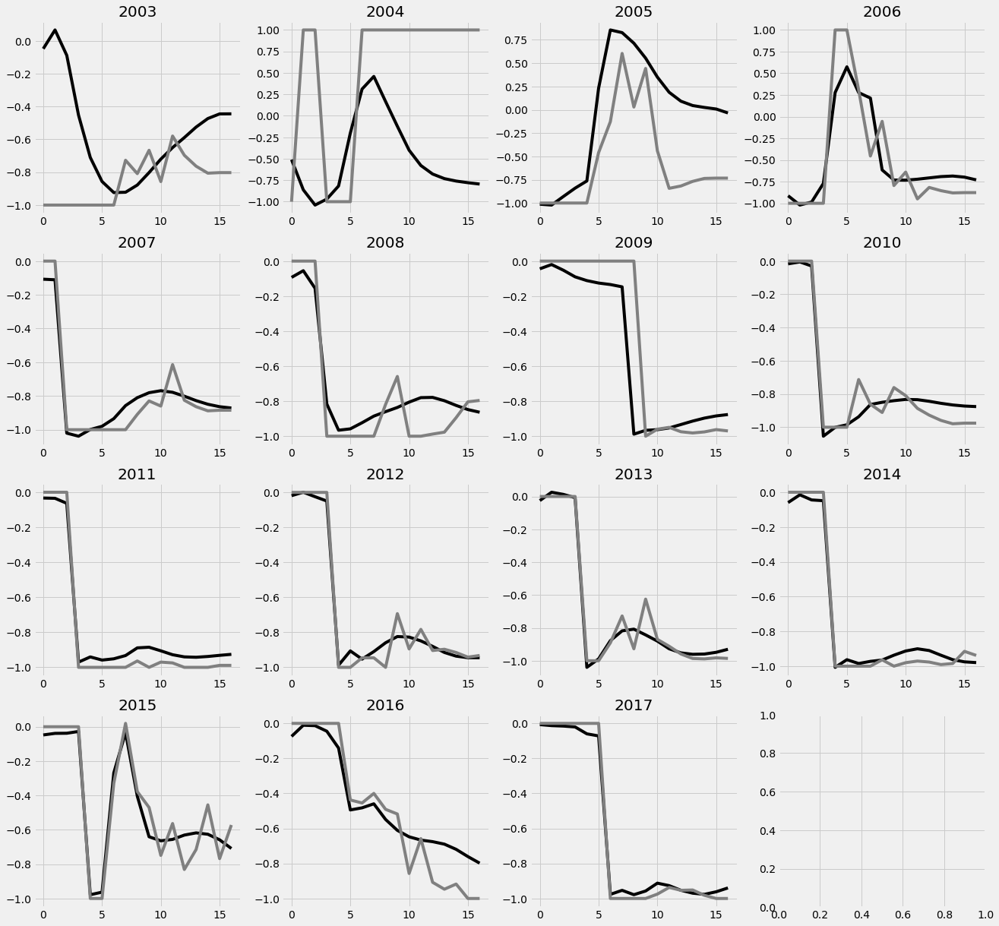

In [283]:
from sklearn.preprocessing import MinMaxScaler

X_scale = np.copy(X)
scalers_x = {}
for i in range(X.shape[1]):
    scalers_x[i] = MinMaxScaler(feature_range=(-1, 1))
    X_scale[:, i, :] = scalers_x[i].fit_transform(X[:, i, :])
X_scale = np.nan_to_num(X_scale)

Y_scale = np.copy(Y)
scalers_y = {}
for i in range(Y.shape[1]):
    scalers_y[i] = MinMaxScaler(feature_range=(-1, 1))
    Y_scale[:, i, :] = scalers_y[i].fit_transform(Y[:, i, :]) 
Y_scale = np.nan_to_num(Y_scale)

model = tf.keras.models.Sequential()

model.add(tf.keras.layers.LSTM(64, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(64))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.LSTM(32, input_shape=(17, 4),
               return_sequences=True,
               activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

model.add(tf.keras.layers.Dense(32))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(1))

model.compile(optimizer='adam', 
              loss='mse')


fig, ax = plt.subplots(nrows=4, ncols=4)
fig.set_figwidth(20)
fig.set_figheight(20)
for j, year in enumerate(analysis_years):
    ind = np.ones((len(analysis_years),), bool)
    ind[j] = False
    train_X = X_scale[ind]
    train_Y = Y_scale[ind]
    
    test_X = X_scale[j].reshape(1, X_scale.shape[1], X_scale.shape[2])
    test_X[0][8:, 0] = np.full(9, 0)
    test_X[0][8:, 2] = np.full(9, 0)
    test_X[0][8:, 3] = np.full(9, 0)
    test_X[0][8:, 1] = np.full(9, 0)
    test_Y = Y_scale[j].reshape(1, Y_scale.shape[1], Y_scale.shape[2])
    
    history = model.fit(train_X, train_Y, 
                    epochs=500, batch_size=16,)
    
    train_predictions = model.predict(train_X)

    # Train RMSE
    train_mse = metrics.mean_squared_error(train_Y.reshape(train_Y.shape[0], train_Y.shape[1] * train_Y.shape[2]),
                               train_predictions.reshape(train_predictions.shape[0], train_predictions.shape[1] * train_predictions.shape[2]))
    
    test_predictions = model.predict(test_X)

    # Test RMSE
    test_mse = metrics.mean_squared_error(test_Y.reshape(test_Y.shape[0], test_Y.shape[1] * test_Y.shape[2]),
                               test_predictions.reshape(test_predictions.shape[0], test_predictions.shape[1] * train_predictions.shape[2]))
    
    print('###################')
    print(f'Train MSE for {year} is {train_mse}')
    print(f'Test MSE for {year} is {test_mse}')
    print('###################')
    
    jx = np.unravel_index(j, ax.shape)
    ax[jx].plot(test_predictions[0], color='black')
    ax[jx].plot(test_Y[0], color='gray')
    ax[jx].set_title(year)

## Parametric

### ARIMA